# CASE STUDY - PREDICTION OF PUMP FAILURE

# **Approach**

**DATA AND CONTEXT**

The given dataset contains data from **51 sensors** covering a period of **almost 3 months** (from 12/04/2018 to 08/07/2018) with **1-minute granularity**.
In this time interval we can observe **3 different states of the pump**: NORMAL, RECOVERING and BROKEN.
The dataset contains a total of **6 occurences of pump failures**, treated as **single events** (failure is associated with a specific timestamp, after which comes the RECOVERING phase).

**GOAL**

The goal of the case study is to create a machine learning model able to predict pump failures.

Additional requirements to take into account:
- the system that implements the model must be able to execute predictions in near real-time (every 10 seconds)
- the users should be able to monitor most critical sensors 

**PROJECT PHASES**

Basically we want to answer two questions:

> 1. What are the most important sensors in order to model the underlying system in relation to failure occurences? 
> 2. Can we predict failures in advance?

**PERFORMANCE EVALUATION**

Since the given problem is a rare event problem (less than 0.004% of the data is in BROKEN status), **F1-score** is used as the accuracy measure for model performance evaluation.

F1-score of the short-term failure class should be evaluated in case of multi-class classification problem.
<br>
<br>



# **Import data**

In this section, dataset is imported from csv file into a Panda's dataframe.
The dataset contains **166.440 rows** and **55 columns**.

> First datetime detected: 2018-04-01 00:00:00 <br>
> Last datetime detected: 2018-07-25 13:59:00

Right after importing the dataset, tools like **Pandas Profiling Report** can be used for the very first controls and data quality evaluations. 
<br>
<br>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/data/

/content/drive/My Drive/data


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv("sensor.csv",index_col=0)
#df.rename(columns={"Unnamed: 0": "row_id"}, inplace=True)
df["row_id"] = range(df.shape[0])

In [ ]:
df.shape

(166440, 55)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 166440 entries, 0 to 166439
Data columns (total 55 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   timestamp       166440 non-null  object 
 1   sensor_00       156235 non-null  float64
 2   sensor_01       166350 non-null  float64
 3   sensor_02       166424 non-null  float64
 4   sensor_03       166424 non-null  float64
 5   sensor_04       166424 non-null  float64
 6   sensor_05       166424 non-null  float64
 7   sensor_06       161645 non-null  float64
 8   sensor_07       160992 non-null  float64
 9   sensor_08       161336 non-null  float64
 10  sensor_09       161848 non-null  float64
 11  sensor_10       166424 non-null  float64
 12  sensor_11       166424 non-null  float64
 13  sensor_12       166424 non-null  float64
 14  sensor_13       166424 non-null  float64
 15  sensor_14       166419 non-null  float64
 16  sensor_15       0 non-null       float64
 17  sensor_16 

In [ ]:
df["timestamp_dt"] = pd.to_datetime(df["timestamp"], dayfirst=True)

In [ ]:
print(f'First datetime: "{df["timestamp_dt"].min()}"')
print(f'Last datetime: "{df["timestamp_dt"].max()}"')
print(f'\nTotal nr of rows: {df.shape[0]}')

First datetime: "2018-04-01 00:00:00"
Last datetime: "2018-07-25 13:59:00"

Total nr of rows: 166440


In [ ]:
df.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status,row_id,timestamp_dt
0,01.04.2018 00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL,0,2018-04-01 00:00:00
1,01.04.2018 00:01,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL,1,2018-04-01 00:01:00
2,01.04.2018 00:02,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL,2,2018-04-01 00:02:00
3,01.04.2018 00:03,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL,3,2018-04-01 00:03:00
4,01.04.2018 00:04,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL,4,2018-04-01 00:04:00


# **Analyze correlations**

In this section we analyzed correlations between sensors.


Setting a high correlation threshold at 0.8, the correlation matrix can be polarized and **3 distinct non-overlapping groups of highly correlated sensors** were detected (connected tuples form 3 non-connected graphs).

In [ ]:
df_variables = df[df.columns.difference(["row_id","timestamp", "timestamp_dt"])] #sensor_15 100% missing values

In [ ]:
df_variables.head()

,machine_status,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51
0,NORMAL,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889
1,NORMAL,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889
2,NORMAL,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037
3,NORMAL,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250
4,NORMAL,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889


In [ ]:
#threshold for relevant correlation
corr_threshold = 0.8

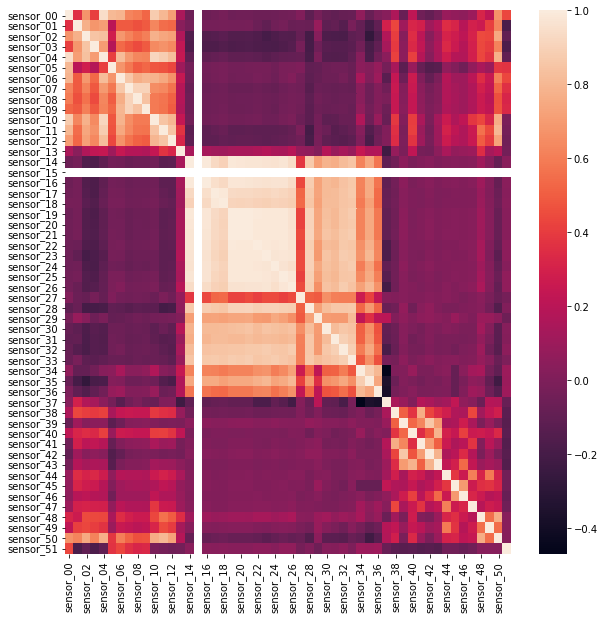

In [ ]:
corrMatrix = df_variables.corr()
plt.figure(figsize = (10,10))
sns.heatmap(corrMatrix, annot=False)
plt.savefig('charts/corrMatrix.png')
plt.show()

In [ ]:
correlated_features = set()
for i in range (len(corrMatrix.columns)):
  for j in range(i):
    columns = []
    if(abs(corrMatrix.iloc[i,j])>corr_threshold):
      colname1 = corrMatrix.columns[i]
      colname2 = corrMatrix.columns[j]
      correlated_features.add((colname1,colname2))

In [ ]:
print(f'Correlation threshold: {corr_threshold}')
print(f'\nTotal nr of features: {len(corrMatrix.columns)}')
print(f'Correlation matrix size: {len(corrMatrix.columns)} * {len(corrMatrix.columns)} = {corrMatrix.size}')
print(f'\nHighly correlated cells detected: {len(correlated_features)}')
print(f'Highly correlated cells detected (% on total): {(100*len(correlated_features)/(corrMatrix.size - len(corrMatrix.columns))):.2f}%')

Correlation threshold: 0.8

Total nr of features: 52
Correlation matrix size: 52 * 52 = 2704

Highly correlated cells detected: 154
Highly correlated cells detected (% on total): 5.81%


In [ ]:
correlated_features

{('sensor_03', 'sensor_02'),
 ('sensor_04', 'sensor_00'),
 ('sensor_04', 'sensor_02'),
 ('sensor_05', 'sensor_00'),
 ('sensor_06', 'sensor_04'),
 ('sensor_07', 'sensor_06'),
 ('sensor_08', 'sensor_07'),
 ('sensor_09', 'sensor_07'),
 ('sensor_09', 'sensor_08'),
 ('sensor_10', 'sensor_00'),
 ('sensor_10', 'sensor_04'),
 ('sensor_11', 'sensor_00'),
 ('sensor_11', 'sensor_04'),
 ('sensor_11', 'sensor_10'),
 ('sensor_12', 'sensor_04'),
 ('sensor_12', 'sensor_11'),
 ('sensor_16', 'sensor_14'),
 ('sensor_17', 'sensor_14'),
 ('sensor_17', 'sensor_16'),
 ('sensor_18', 'sensor_14'),
 ('sensor_18', 'sensor_16'),
 ('sensor_18', 'sensor_17'),
 ('sensor_19', 'sensor_14'),
 ('sensor_19', 'sensor_16'),
 ('sensor_19', 'sensor_17'),
 ('sensor_19', 'sensor_18'),
 ('sensor_20', 'sensor_14'),
 ('sensor_20', 'sensor_16'),
 ('sensor_20', 'sensor_17'),
 ('sensor_20', 'sensor_18'),
 ('sensor_20', 'sensor_19'),
 ('sensor_21', 'sensor_14'),
 ('sensor_21', 'sensor_16'),
 ('sensor_21', 'sensor_17'),
 ('sensor_21',

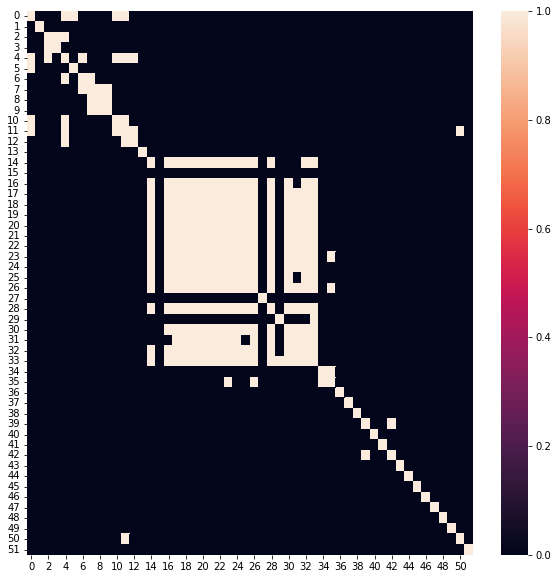

In [ ]:
corrMatrix_bin = np.where(corrMatrix>= 0.8, 1, 0)
plt.figure(figsize = (10,10))
sns.heatmap(corrMatrix_bin, annot=False)
plt.savefig('charts/corrMatrix_bin.png', dpi=200)
plt.show()

In [ ]:
#Given n tuples representing pairs, return a list with connected tuples
import networkx as nx
G = nx.Graph()
G.add_edges_from(list(correlated_features))
list(nx.connected_components(G))

[{'sensor_14',
  'sensor_16',
  'sensor_17',
  'sensor_18',
  'sensor_19',
  'sensor_20',
  'sensor_21',
  'sensor_22',
  'sensor_23',
  'sensor_24',
  'sensor_25',
  'sensor_26',
  'sensor_28',
  'sensor_29',
  'sensor_30',
  'sensor_31',
  'sensor_32',
  'sensor_33',
  'sensor_34',
  'sensor_35'},
 {'sensor_00',
  'sensor_02',
  'sensor_03',
  'sensor_04',
  'sensor_05',
  'sensor_06',
  'sensor_07',
  'sensor_08',
  'sensor_09',
  'sensor_10',
  'sensor_11',
  'sensor_12',
  'sensor_50'},
 {'sensor_39', 'sensor_42'}]

In [ ]:
dict_group = dict()
for i,group in enumerate(list(nx.connected_components(G))):
  dict_group["Group " + str(i+1)] = group
[print(key,':',sorted(value)) for key, value in dict_group.items()];

Group 1 : ['sensor_14', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25', 'sensor_26', 'sensor_28', 'sensor_29', 'sensor_30', 'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34', 'sensor_35']
Group 2 : ['sensor_00', 'sensor_02', 'sensor_03', 'sensor_04', 'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08', 'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_50']
Group 3 : ['sensor_39', 'sensor_42']


# **Check consecutive rows**

The dataset rows are ordered by timestamp and **each row is exactly 1-minute after the previous one** (no "blind spots" during the data collection interval). 

In [ ]:
df.sort_values(by='timestamp_dt', inplace = True) 

In [ ]:
df_diff = df[df.columns.difference(["machine_status","timestamp"])].diff(periods=1)
df_diff.head()

,row_id,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,timestamp_dt
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
1,1.0,0.000000,0.00000,0.0000,0.000000,0.0000,0.00000,0.00000,0.00000,0.00000,...,0.00000,0.000000,0.00000,0.00000,0.000000,0.0000,0.00000,0.0000,0.0000,0 days 00:01:00
2,1.0,-0.020660,0.26042,0.0000,0.086810,4.5139,-2.91377,-0.08681,-0.09403,0.05064,...,-0.26042,-0.289348,-0.28935,0.28935,0.000003,-2.0255,-0.57871,-1.7362,2.3148,0 days 00:01:00
3,1.0,0.015740,-0.26042,-0.0434,-0.000002,-10.7639,3.44300,-0.00723,0.20978,0.07957,...,-0.78125,-0.289352,-0.57871,0.00000,-0.000003,0.0000,-0.28935,-0.8680,-0.5787,0 days 00:01:00
4,1.0,-0.014756,0.04340,0.0434,0.000000,8.3333,-0.40001,0.03617,-0.03617,0.00000,...,0.52084,-0.289350,0.28935,0.57870,0.578710,2.3149,-0.28935,1.7361,-1.7361,0 days 00:01:00


In [ ]:
df_diff.shape

(166440, 54)

In [ ]:
#60000000000 ns = 60 s
df_diff.timestamp_dt.unique()

array([      'NaT', 60000000000], dtype='timedelta64[ns]')

# **Machine status transitions**

The goal of this section is to highlight machine status **transitions from NORMAL to BROKEN to RECOVERING** with their specific timestamp. 

Therefore, it is possible to calculate the duration of each status from one state to another.

Relevant findings:
- BROKEN state has always 1-minute duration, after which comes always RECOVERING
- during RECOVERING some sensors may be switched-off
- after a RECOVERING (maintenance operation) can happen that the NORMAL state last less than 4-5 days (bathtub-curve effect? **infant mortality of equipment components** or **human-related errors** during the maintenance operation?)
<br>
<br>
These findings must be discussed with subject matter experts and can be very important for feature engineering.
<br>
<br>



In [ ]:
df.machine_status.unique()

array(['NORMAL', 'BROKEN', 'RECOVERING'], dtype=object)

In [ ]:
machine_status_id = {'NORMAL': 0, 'BROKEN': 1,'RECOVERING': 2}

In [ ]:
df['machine_status_id'] = df['machine_status'].map(machine_status_id)

In [ ]:
df['change_status'] = ~df['machine_status_id'].diff().eq(0)

In [ ]:
df_status_transitions = df[df['change_status']][['row_id','timestamp_dt','machine_status']].reset_index(drop=True)
df_status_transitions

,row_id,timestamp_dt,machine_status
0,0,2018-04-01 00:00:00,NORMAL
1,17155,2018-04-12 21:55:00,BROKEN
2,17156,2018-04-12 21:56:00,RECOVERING
3,18100,2018-04-13 13:40:00,NORMAL
4,24510,2018-04-18 00:30:00,BROKEN
5,24511,2018-04-18 00:31:00,RECOVERING
6,27621,2018-04-20 04:21:00,NORMAL
7,69318,2018-05-19 03:18:00,BROKEN
8,69319,2018-05-19 03:19:00,RECOVERING
9,70631,2018-05-20 01:11:00,NORMAL


In [ ]:
#calculate difference between consecutive rows and shift up 1 row to associate eache status with its duration 
df_status_transitions["duration"] = df_status_transitions["timestamp_dt"].diff().shift(-1)
df_status_transitions

,row_id,timestamp_dt,machine_status,duration
0,0,2018-04-01 00:00:00,NORMAL,11 days 21:55:00
1,17155,2018-04-12 21:55:00,BROKEN,0 days 00:01:00
2,17156,2018-04-12 21:56:00,RECOVERING,0 days 15:44:00
3,18100,2018-04-13 13:40:00,NORMAL,4 days 10:50:00
4,24510,2018-04-18 00:30:00,BROKEN,0 days 00:01:00
5,24511,2018-04-18 00:31:00,RECOVERING,2 days 03:50:00
6,27621,2018-04-20 04:21:00,NORMAL,28 days 22:57:00
7,69318,2018-05-19 03:18:00,BROKEN,0 days 00:01:00
8,69319,2018-05-19 03:19:00,RECOVERING,0 days 21:52:00
9,70631,2018-05-20 01:11:00,NORMAL,4 days 23:19:00


In [ ]:
#transform timedelta64[ns] duration into corresponding duration measured in minutes, hours and days
df_status_transitions["minutes"]=df_status_transitions["duration"].values/np.timedelta64(1, 'm')
df_status_transitions["hours"]=df_status_transitions["duration"].values/np.timedelta64(1, 'h')
df_status_transitions["days"]=df_status_transitions["duration"]/np.timedelta64(1, 'D')
df_status_transitions

,row_id,timestamp_dt,machine_status,duration,minutes,hours,days
0,0,2018-04-01 00:00:00,NORMAL,11 days 21:55:00,17155.0,285.916667,11.913194
1,17155,2018-04-12 21:55:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694
2,17156,2018-04-12 21:56:00,RECOVERING,0 days 15:44:00,944.0,15.733333,0.655556
3,18100,2018-04-13 13:40:00,NORMAL,4 days 10:50:00,6410.0,106.833333,4.451389
4,24510,2018-04-18 00:30:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694
5,24511,2018-04-18 00:31:00,RECOVERING,2 days 03:50:00,3110.0,51.833333,2.159722
6,27621,2018-04-20 04:21:00,NORMAL,28 days 22:57:00,41697.0,694.950000,28.956250
7,69318,2018-05-19 03:18:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694
8,69319,2018-05-19 03:19:00,RECOVERING,0 days 21:52:00,1312.0,21.866667,0.911111
9,70631,2018-05-20 01:11:00,NORMAL,4 days 23:19:00,7159.0,119.316667,4.971528


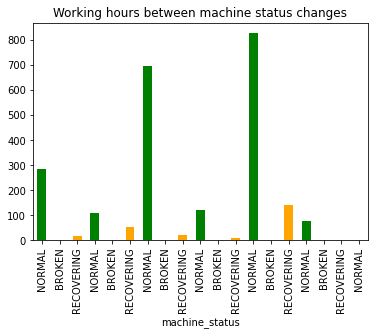

In [ ]:
# BROKEN has always duration = 1 minute
color_dict = {'NORMAL':'green', 'BROKEN': 'red', 'RECOVERING':'orange'}
df_status_transitions.plot(kind='bar', x='machine_status', y='hours', 
                           color=df_status_transitions['machine_status'].replace(color_dict), legend=False,
                           title = 'Working hours between machine status changes');

# **Isolate failures**

During the Exploratory Data Analysis stage, a **visual inspection** of the dataset and of each failure can be useful to better understand the context and familiarize with the dataset.

**Self-service/external BI tool** can also be used, even if they can not manage very big dataset, to analyze portions of the dataset and/or relevant events.

Why?
> - Analyze the "big picture"
> - Promote discussion with business users who can not use Python
> - Monitor data quality/data collection issues (e.r. rows collected per day, per sensor, missing data, ...)

In this example, we exported in **Power BI** the entire dataset, flagging 5 hours before and after *failure N* as  *NEAR FAILURE N*.
<br>
<br>

In [ ]:
df_failures = df[df.machine_status=="BROKEN"]

In [ ]:
df_failures

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status,row_id,timestamp_dt,machine_status_id,change_status
17155,12.04.2018 21:55,0.000000,53.34201,52.821180,43.402775,202.526031,49.79289,3.219039,16.890910,16.869210,...,46.006940,409.143500,121.527800,401.909700,324.6528,BROKEN,17155,2018-04-12 21:55:00,1,True
24510,18.04.2018 00:30,1.093982,42.53472,47.699650,41.449650,206.038757,60.30106,12.304690,15.154800,14.185470,...,33.275460,59.895830,44.560180,177.662000,183.7384,BROKEN,24510,2018-04-18 00:30:00,1,True
69318,19.05.2018 03:18,2.258796,47.26563,52.734370,43.446178,200.115738,66.14643,13.592300,15.914350,15.147570,...,45.428240,144.675900,49.768520,246.238400,257.5231,BROKEN,69318,2018-05-19 03:18:00,1,True
77790,25.05.2018 00:30,2.321759,47.48264,51.475693,42.795136,612.152800,67.30158,14.062500,16.608800,15.943290,...,153.935200,155.381900,65.682870,220.196800,267.3611,BROKEN,77790,2018-05-25 00:30:00,1,True
128040,28.06.2018 22:00,0.364005,40.19097,45.225690,40.190971,201.368622,0.00000,11.335360,15.270540,15.183740,...,29.224537,29.224537,29.513889,32.407406,NaN,BROKEN,128040,2018-06-28 22:00:00,1,True
141131,08.07.2018 00:11,0.001968,45.13889,52.907990,45.355900,500.000000,1.40131,0.028935,0.036169,0.036169,...,43.402780,99.537030,44.849540,192.129600,174.7685,BROKEN,141131,2018-07-08 00:11:00,1,True


In [ ]:
list(df_failures.row_id)

[17155, 24510, 69318, 77790, 128040, 141131]

In [ ]:
df["failure_interval"] = "NO_FAILURE"

In [ ]:
failure_interval_width = 300

In [ ]:
for n, elem in enumerate(list(df_failures.row_id)):
  df.loc[elem -failure_interval_width : elem + failure_interval_width, "failure_interval"] = "NEAR_FAILURE_" + str(n+1)

In [ ]:
df.to_csv('sensor_with_interval.csv', index=False)

# **Operation**

An additional property ***operation*** is added to the dataset.

It is derived from the machine status and it is useful both for effective data visualization and for the model development.

- state NORMAL => operation = 1
- state BROKEN => operation = 0
- state RECOVERING => operation = 0.5

In [ ]:
conditions = [(df['machine_status'] =='NORMAL'), (df['machine_status'] =='BROKEN'), (df['machine_status'] =='RECOVERING')]
choices = [1, 0, 0.5]
df['operation'] = np.select(conditions, choices, default=0)

In [ ]:
df.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_48,sensor_49,sensor_50,sensor_51,machine_status,row_id,timestamp_dt,machine_status_id,change_status,operation
0,01.04.2018 00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,157.9861,67.70834,243.0556,201.3889,NORMAL,0,2018-04-01 00:00:00,0,True,1.0
1,01.04.2018 00:01,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,157.9861,67.70834,243.0556,201.3889,NORMAL,1,2018-04-01 00:01:00,0,False,1.0
2,01.04.2018 00:02,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,155.9606,67.12963,241.3194,203.7037,NORMAL,2,2018-04-01 00:02:00,0,False,1.0
3,01.04.2018 00:03,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,155.9606,66.84028,240.4514,203.1250,NORMAL,3,2018-04-01 00:03:00,0,False,1.0
4,01.04.2018 00:04,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,158.2755,66.55093,242.1875,201.3889,NORMAL,4,2018-04-01 00:04:00,0,False,1.0


# **Visualize time series data**

A lot of data discovery activities and experimentation can be done through data visualization.

In this section we prepared some charts to have the overall picture and some others to analyze data around failures, with **parametric time interval and sensor groups** as input.
<br>
<br>


In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt

In [ ]:
#time = ['timestamp_dt']
num_variables =  [column for column in df if column.startswith('sensor_')]
target = ['operation']

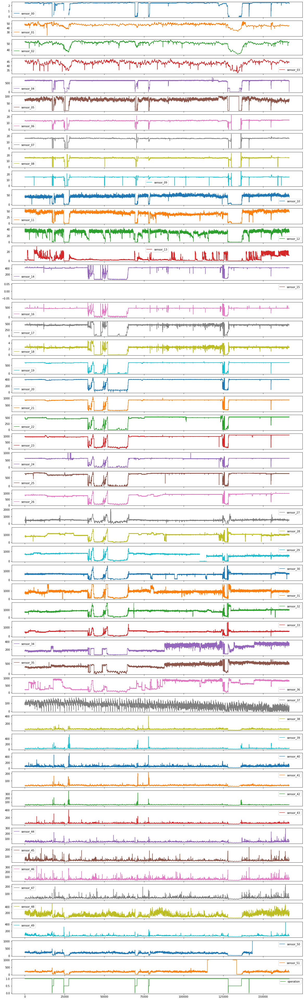

In [ ]:
#visualize all sensors --> compare with correlation groups
df[num_variables+target].plot(subplots =True, sharex = True, figsize = (20,70));

### **Sensor groups analysis**

In [ ]:
sensor_group = ['operation','sensor_04', 'sensor_06', 'sensor_07', 'sensor_08', 'sensor_09'] #drop around 5 minutes before failures except from failures 4-5
#sensor_group = ['operation', 'sensor_17','sensor_18','sensor_19', 'sensor_20','sensor_25','sensor_26', 'sensor_28'] #flutter with failures
#sensor_group = ['operation', 'sensor_39','sensor_42'] #flutter with failures but grows before failure 4

#sensor_group = ['operation','sensor_06', 'sensor_11', 'sensor_04', 'sensor_12', 'sensor_10', 'sensor_00'] #selected features

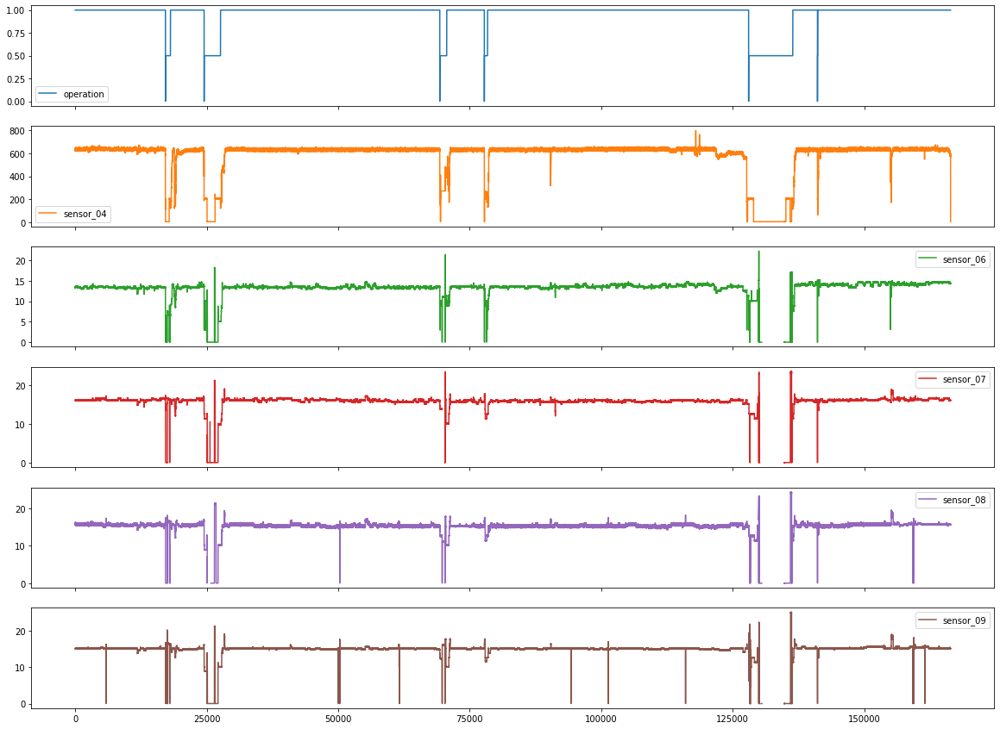

In [ ]:
df[sensor_group].plot(subplots =True, sharex = True, figsize = (20,15));

In [ ]:
fig = make_subplots(rows=len(sensor_group), cols=1,  shared_xaxes=True,subplot_titles=sensor_group)
for i,sensor in enumerate(sensor_group):
  fig.add_trace(go.Scatter(x=df['timestamp_dt'], y=df[sensor]), i+1, 1)
  #fig = px.line(df, x='timestamp_dt', y=sensor, title=sensor)
#fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(height=800, width=1400, xaxis_rangeslider_visible=True, showlegend=False)
fig.show()  

### **Visualize data around failures**

In [ ]:
df_failures = df[df.operation==0]

In [ ]:
#row_id for failures
list(df_failures.row_id)

[17155, 24510, 69318, 77790, 128040, 141131]

In [ ]:
failure_id = 6 #failure to analyze
failure_interval_width = 60 #minutes

In [ ]:
#df_failures.iloc[failure_id,:]["timestamp_dt"]
row_id_failure = list(df_failures.row_id)[failure_id-1]

print(f'Analyzing failure # {failure_id}')
print(f'Interval width [min] {failure_interval_width}')
print(f'\nFailure time {df_failures.iloc[failure_id-1,:]["timestamp_dt"]}')
print(f'Failure position [row_id] {row_id_failure}')

fig = make_subplots(rows=len(sensor_group), cols=1,  shared_xaxes=True,subplot_titles=sensor_group)
df_filtered = df.iloc[row_id_failure-failure_interval_width: row_id_failure+failure_interval_width, :]
for i,sensor in enumerate(sensor_group):
  fig.add_trace(go.Scatter(x=df_filtered['timestamp_dt'], y=df_filtered[sensor]), i+1, 1)
  #fig = px.line(df, x='timestamp_dt', y=sensor, title=sensor)
#fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(height=800, width=1400, xaxis_rangeslider_visible=False, showlegend=False)
fig.show()  

Analyzing failure # 6
Interval width [min] 60

Failure time 2018-07-08 00:11:00
Failure position [row_id] 141131


### **[temp] Useful data viz for sensors time series**

In [ ]:
#timestamp_dt
fig = px.line(df, x='timestamp_dt', y='sensor_11', title='Time Series with Rangeslider')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

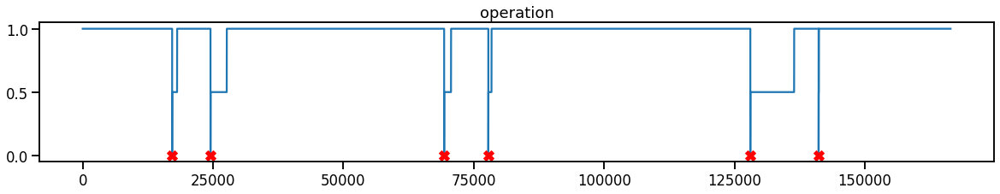

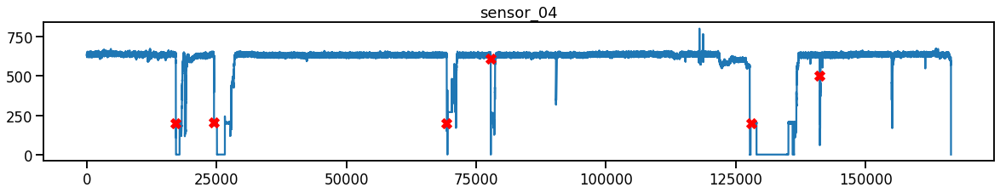

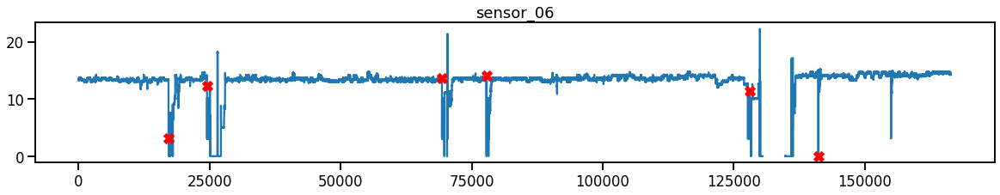

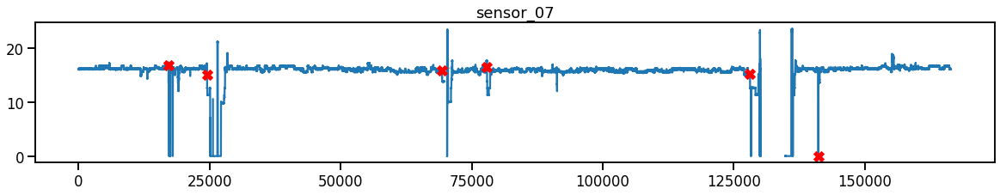

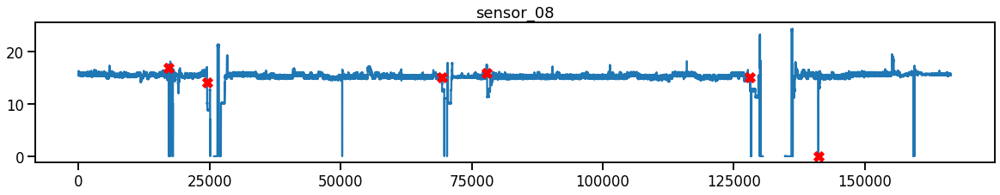

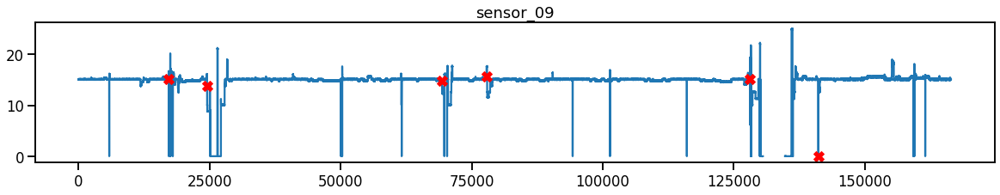

In [ ]:
dfBroken = df[df['machine_status']=='BROKEN']
sensorNames=[col for col in df if col.startswith("sensor_")]
for sensor in sensor_group:
    sns.set_context('talk')
    _ = plt.figure(figsize=(20,3))
    _ = plt.plot(df[sensor])
    _ = plt.plot(dfBroken[sensor], linestyle='none', marker='X', color='red', markersize=12)
    _ = plt.title(sensor)
    plt.show()

In [ ]:
fig = px.line(df, x='timestamp_dt', y='sensor_11', title='Time Series with Range Slider and Selectors')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [ ]:
df.groupby(['machine_status','operation'])['timestamp'].count()

machine_status  operation
BROKEN          0.0               6
NORMAL          1.0          152032
RECOVERING      0.5           14402
Name: timestamp, dtype: int64

# **Preprocessing**

Before starting with the ML phase, it is essential to deal with missing data.

The following choices were therefore applied to pump sensors dataset:
- **drop** columns with more than 10% of missing values (**sensor 15, sensor 50**)
- **drop** column corresponding to **sensor 51** because it has a sensible amount of missing data (9%) and stopped working for a considerable amount of time (several days) when the pump state was NORMAL
- apply **forward-fill strategy** to deal with the remaining missing values, since they correspond mainly to RECOVERING state
<br>
<br>


The **msno nullity-matrix** is used as the visual to quickly display data completeness through this process.
<br>
<br>


In [ ]:
import missingno as msno 

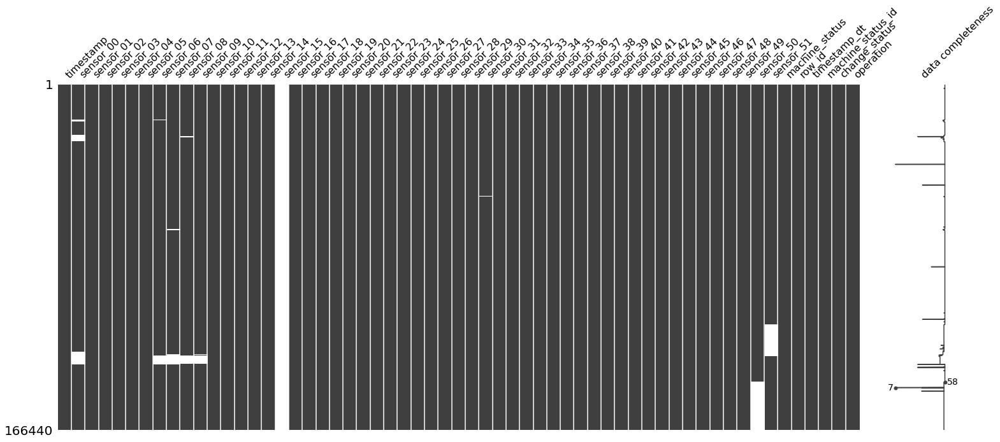

In [ ]:
msno.matrix(df, labels=True);

In [ ]:
def cal_percent_nans(df):
    nans = pd.DataFrame(df.isnull().sum().sort_values(ascending=False) / len(df),
                       columns=['percent'])
    idx = nans['percent'] > 0
    return nans[idx]

cal_percent_nans(df).head(10)

,percent
sensor_15,1.000000
sensor_50,0.139011
sensor_51,0.092406
sensor_00,0.061313
sensor_07,0.032733
sensor_08,0.030666
sensor_06,0.028809
sensor_09,0.027590
sensor_30,0.001568
sensor_01,0.000541


In [ ]:
df_pre = df.copy()

# remove columns with too many NaN cols (> 10 %)
df_pre.drop(['sensor_15', 'sensor_50'], axis=1, inplace=True)
print(df_pre.columns)

Index(['timestamp', 'sensor_00', 'sensor_01', 'sensor_02', 'sensor_03',
       'sensor_04', 'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08',
       'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13',
       'sensor_14', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19',
       'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24',
       'sensor_25', 'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29',
       'sensor_30', 'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34',
       'sensor_35', 'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39',
       'sensor_40', 'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44',
       'sensor_45', 'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49',
       'sensor_51', 'machine_status', 'row_id', 'timestamp_dt',
       'machine_status_id', 'change_status', 'operation'],
      dtype='object')


In [ ]:
df_pre.drop(['sensor_51'], axis=1, inplace=True) 

In [ ]:
time = ['timestamp_dt']
num_variables =  [column for column in df_pre if column.startswith('sensor_')]
target = ['operation']

In [ ]:
df_pre = df_pre[time + num_variables + target].copy()
df_pre.rename(columns={"timestamp_dt": "timestamp"},inplace=True)
df_pre.columns

Index(['timestamp', 'sensor_00', 'sensor_01', 'sensor_02', 'sensor_03',
       'sensor_04', 'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08',
       'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13',
       'sensor_14', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19',
       'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24',
       'sensor_25', 'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29',
       'sensor_30', 'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34',
       'sensor_35', 'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39',
       'sensor_40', 'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44',
       'sensor_45', 'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49',
       'operation'],
      dtype='object')

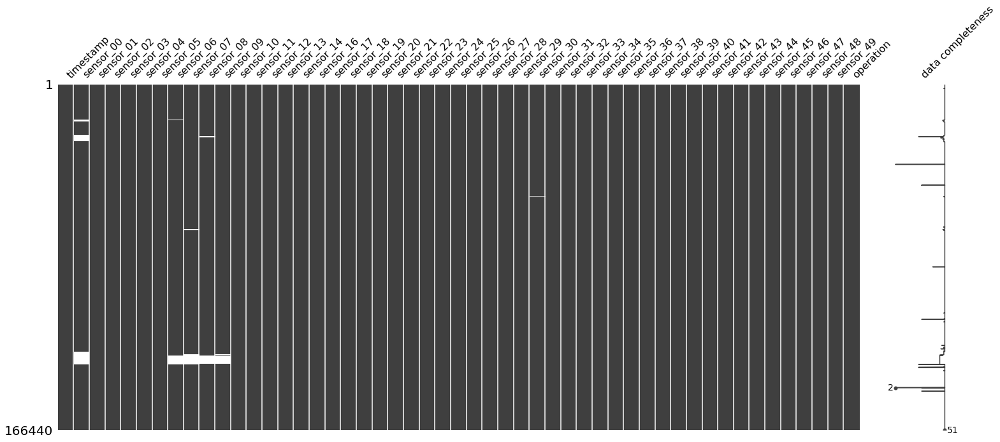

In [ ]:
msno.matrix(df_pre,labels=True);

In [ ]:
df_pre = df_pre.fillna(method='ffill')

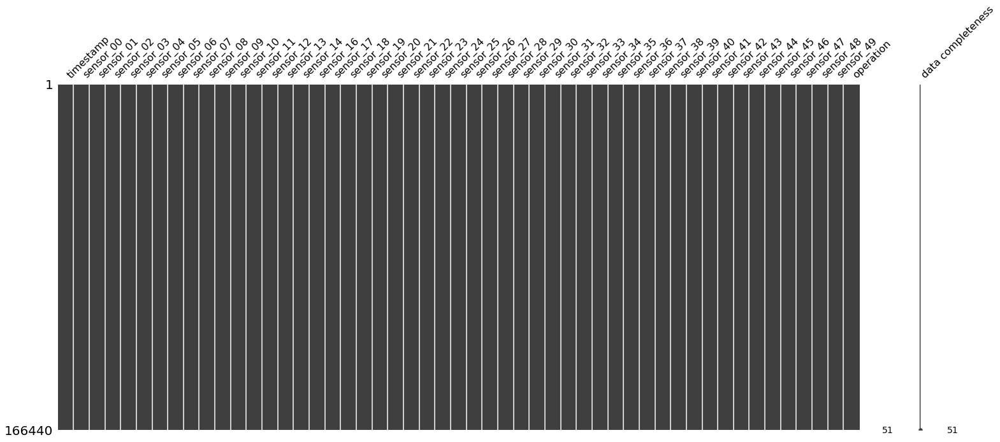

In [ ]:
msno.matrix(df_pre,labels=True);

In [ ]:
df_pre.columns

Index(['timestamp', 'sensor_00', 'sensor_01', 'sensor_02', 'sensor_03',
       'sensor_04', 'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08',
       'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13',
       'sensor_14', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19',
       'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24',
       'sensor_25', 'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29',
       'sensor_30', 'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34',
       'sensor_35', 'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39',
       'sensor_40', 'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44',
       'sensor_45', 'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49',
       'operation'],
      dtype='object')

In [ ]:
df_pre.to_csv('sensor_preprocessed.csv',index=False)

In [ ]:
#corresponding to 49 sensors + timestamp + operation columns
df_pre.shape

(166440, 51)

# **Import preprocessed data**

Preprocessed data are exported to a csv file, in order to decouple data preparation from the subsequent stages. 

Preprocessed dataset contains:
- **166.440 rows** (all the rows of the original dataset)
- **51 columns** (49 sensors + timestamp + operation columns)

In [ ]:
df_pre = pd.read_csv('sensor_preprocessed.csv',parse_dates=['timestamp'])

In [ ]:
df_pre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166440 entries, 0 to 166439
Data columns (total 51 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   timestamp  166440 non-null  datetime64[ns]
 1   sensor_00  166440 non-null  float64       
 2   sensor_01  166440 non-null  float64       
 3   sensor_02  166440 non-null  float64       
 4   sensor_03  166440 non-null  float64       
 5   sensor_04  166440 non-null  float64       
 6   sensor_05  166440 non-null  float64       
 7   sensor_06  166440 non-null  float64       
 8   sensor_07  166440 non-null  float64       
 9   sensor_08  166440 non-null  float64       
 10  sensor_09  166440 non-null  float64       
 11  sensor_10  166440 non-null  float64       
 12  sensor_11  166440 non-null  float64       
 13  sensor_12  166440 non-null  float64       
 14  sensor_13  166440 non-null  float64       
 15  sensor_14  166440 non-null  float64       
 16  sensor_16  166440 no

In [ ]:
df_pre.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,operation
0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,1.0
1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,1.0
2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,30.46875,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,1.0
3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,30.46875,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,1.0
4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,30.98958,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,1.0


In [ ]:
#corresponding to 49 sensors + timestamp + operation columns
df_pre.shape

(166440, 51)

# **Feature importance**

In this section we want to answer the first question provided in the Project phases: 

**What are the important sensors in order to model the underlying system in relation to failure occurences?**

<br>

At this stage, the goal is not to predict the failure in advance but to be able to detect - and therefore select - sensors (process variables) impacting failures

> $f(t) = f(sensor_1(t), sensor_2(t), ... sensor_n(t))$

In other words, at this stage, **features and failures refer to the same moment in time**.  
<br>

In a real project, it can be considered the final and most **advanced part of Exploratory Data Analysis (EDA)**, to be conducted together with subject matter experts.  
<br>
<br>


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import model_selection
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, cross_val_score, GridSearchCV, RepeatedStratifiedKFold, StratifiedShuffleSplit
from sklearn import ensemble
from sklearn.metrics import plot_confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import joblib

### **Random Forest**

With this first model, we tackle a less unbalanced problem which is:

> ***Can we distinguish between NORMAL and ABNORMAL states?*** 

where both RECOVERING and BROKEN states are treated as ABNORMAL machine states.
<br>
<br>
According to this definition, the current dataset has aroud **9% of rows representing abnormal states**.
<br>
<br>

In [ ]:
df_fi = df_pre.copy()

df_fi['target'] = 0
df_fi.loc[df_fi['operation'] != 1, 'target'] = 1 #when recovering the machine state should be treated as abnormal
df_fi.drop(['operation'], axis=1, inplace=True)
df_fi.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,target
0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,0
1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,0
2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,30.46875,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,0
3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,30.46875,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,0
4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,30.98958,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,0


In [ ]:
#original dataset: 6 failures (broken) out of 166440 rows
#this dataset: 14408 abnormal (broken + recovering) out of 166440 rows -> 8,7%
df_fi.shape

(166440, 51)

In [ ]:
df_fi.target.sum()

14408

In [ ]:
X = df_fi.drop(['target','timestamp'], axis=1)
y = df_fi['target']
X.head()

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49
0,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,70.57291,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
1,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,70.57291,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
2,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,69.53125,30.46875,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963
3,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,72.13541,30.46875,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028
4,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,76.82291,30.98958,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093


In [ ]:
print(X.shape)
print(y.shape)

(166440, 49)
(166440,)


In [ ]:
x_train, x_test, y_train, y_test = model_selection.train_test_split(
    X,
    y,
    test_size=0.2, #0.5 (#0.2)
    #stratify=y,
    shuffle=False, #(shuffle=True)
    random_state=42
)

In [ ]:
print(f'x_train.shape: "{x_train.shape}"')
print(f'x_test.shape: "{x_test.shape}"')
print(f'y_train.shape: "{y_train.shape}"')
print(f'y_test.shape: "{y_test.shape}"')

x_train.shape: "(133152, 49)"
x_test.shape: "(33288, 49)"
y_train.shape: "(133152,)"
y_test.shape: "(33288,)"


In [ ]:
#recovering or broken in training set
y_train.sum()

11087

In [ ]:
#recovering or broken in test set
y_test.sum()

3321

In [ ]:
#temp
failures_row_id = [17155, 24510, 69318, 77790, 128040, 141131]

In [ ]:
#broken events in training set
for failure in failures_row_id:
  print(failure in list(y_train.index))

True
True
True
True
True
False


In [ ]:
#broken events in test set
for failure in failures_row_id:
  print(failure in list(y_test.index))

False
False
False
False
False
True


In [ ]:
#features are not scaled yet
x_train.head()

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49
0,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,70.57291,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
1,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,70.57291,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
2,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,69.53125,30.46875,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963
3,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,72.13541,30.46875,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028
4,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,76.82291,30.98958,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093


In [ ]:
#FEATURES SCALING (applied after train/test split to avoid data leakage)
scaler = MinMaxScaler(feature_range=(0, 1))
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [ ]:
# Initialize and fit model
rf = ensemble.RandomForestClassifier(random_state=42)
rf.fit(x_train_scaled, y_train)
#Return the mean accuracy on the given test data and labels
rf.score(x_test_scaled, y_test) 

0.9945025234318673

In [ ]:
# save
#joblib.dump(rf, "models/random_forest_no_shuffle_20230208.joblib")
# load, no need to initialize the loaded_rf
#rf = joblib.load("models/random_forest_no_shuffle.joblib")

['models/random_forest_no_shuffle_20230208.joblib']

In [ ]:
y_pred = rf.predict(x_test_scaled)

In [ ]:
y_pred.sum()

3450

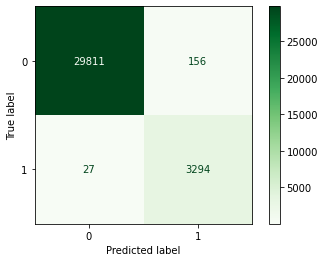

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(rf, x_test_scaled, y_test, cmap='Greens', values_format='')
plt.show()

In [ ]:
print('\nClassification Report\n')
print(classification_report(y_test, rf.predict(x_test_scaled)))


Classification Report

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     29967
           1       0.95      0.99      0.97      3321

    accuracy                           0.99     33288
   macro avg       0.98      0.99      0.98     33288
weighted avg       0.99      0.99      0.99     33288



In [ ]:
x_test.loc[[141131]]

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49
141131,0.001968,45.13889,52.90799,45.3559,500.0,1.40131,0.028935,0.036169,0.036169,0.007234,...,39.32291,35.41666,32.8125,36.19791,37.32639,35.30093,38.19444,43.40278,99.53703,44.84954


In [ ]:
xf_test_scaled = scaler.transform(x_test.loc[[141131]])
xf_test_scaled

array([[7.71902962e-04, 6.80989568e-01, 8.53360531e-01, 8.08139145e-01,
        6.23683819e-01, 1.40131168e-02, 6.50618120e-04, 1.53846134e-03,
        3.10752201e-04, 3.24464623e-04, 3.41331255e-01, 3.99504500e-01,
        4.44346667e-01, 3.55154541e-01, 8.32464072e-01, 6.28396136e-01,
        7.84913913e-01, 5.40160673e-01, 7.61288625e-01, 8.90036910e-01,
        7.75988170e-01, 9.02816562e-01, 9.44058448e-01, 6.28236100e-01,
        9.05100557e-01, 7.71550886e-01, 2.54992900e-01, 5.65382504e-01,
        3.83429579e-01, 4.18113375e-01, 5.70674488e-01, 5.15031968e-01,
        3.25045221e-01, 6.28682509e-01, 8.28471985e-01, 6.26031268e-01,
        1.71797163e-01, 6.30508399e-02, 2.31527247e-02, 3.24640641e-02,
        7.35873732e-02, 3.03254412e-02, 3.05084628e-02, 5.92592660e-02,
        4.62686683e-02, 4.02750348e-02, 9.55631518e-02, 1.53799382e-01,
        6.14634296e-02]])

In [ ]:
#the last failure is predicted correctly
rf.predict(xf_test_scaled)

array([1])

In [ ]:
importances = rf.feature_importances_
importances

array([0.0588462 , 0.0423956 , 0.02955219, 0.00283803, 0.07402638,
       0.02089573, 0.0471575 , 0.00369652, 0.01385388, 0.00840725,
       0.11979572, 0.11886456, 0.15509731, 0.07209652, 0.00289729,
       0.00091683, 0.00118952, 0.00120767, 0.00116527, 0.00193939,
       0.00113782, 0.00029414, 0.00418706, 0.00071127, 0.00082773,
       0.00082651, 0.00108642, 0.00252118, 0.00218749, 0.00030549,
       0.00166807, 0.000523  , 0.00083867, 0.00135827, 0.00222146,
       0.00493373, 0.00100843, 0.0320599 , 0.00620521, 0.03275241,
       0.00687348, 0.00466044, 0.02290018, 0.0020295 , 0.00285084,
       0.01595425, 0.00140672, 0.04583642, 0.02299455])

In [ ]:
important_features_dict = {}
for idx, val in enumerate(rf.feature_importances_):
    important_features_dict[idx] = val

important_features_list = sorted(important_features_dict,
                                 key=important_features_dict.get,
                                 reverse=True)

print(f'10 most important features: {important_features_list[:10]}')

10 most important features: [12, 10, 11, 4, 13, 0, 6, 47, 1, 39]


In [ ]:
sorted_idx = importances.argsort()
sorted_idx

array([21, 29, 31, 23, 25, 24, 32, 15, 36, 26, 20, 18, 16, 17, 33, 46, 30,
       19, 43, 28, 34, 27,  3, 44, 14,  7, 22, 41, 35, 38, 40,  9,  8, 45,
        5, 42, 48,  2, 37, 39,  1, 47,  6,  0, 13,  4, 11, 10, 12])

In [ ]:
x_train.columns[sorted_idx]

Index(['sensor_22', 'sensor_30', 'sensor_32', 'sensor_24', 'sensor_26',
       'sensor_25', 'sensor_33', 'sensor_16', 'sensor_37', 'sensor_27',
       'sensor_21', 'sensor_19', 'sensor_17', 'sensor_18', 'sensor_34',
       'sensor_47', 'sensor_31', 'sensor_20', 'sensor_44', 'sensor_29',
       'sensor_35', 'sensor_28', 'sensor_03', 'sensor_45', 'sensor_14',
       'sensor_07', 'sensor_23', 'sensor_42', 'sensor_36', 'sensor_39',
       'sensor_41', 'sensor_09', 'sensor_08', 'sensor_46', 'sensor_05',
       'sensor_43', 'sensor_49', 'sensor_02', 'sensor_38', 'sensor_40',
       'sensor_01', 'sensor_48', 'sensor_06', 'sensor_00', 'sensor_13',
       'sensor_04', 'sensor_11', 'sensor_10', 'sensor_12'],
      dtype='object')

In [ ]:
x_train.columns[sorted_idx][-10:]

Index(['sensor_40', 'sensor_01', 'sensor_48', 'sensor_06', 'sensor_00',
       'sensor_13', 'sensor_04', 'sensor_11', 'sensor_10', 'sensor_12'],
      dtype='object')

Text(0.5, 0, 'Feature Importance')

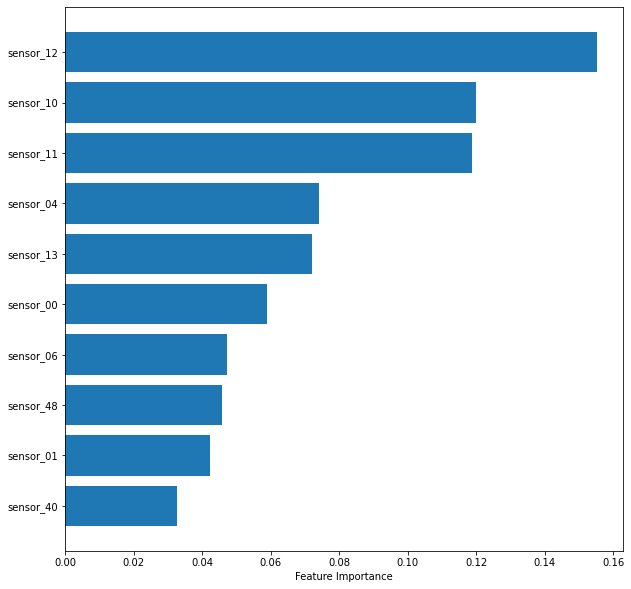

In [ ]:
top_n_features = 10

importances = rf.feature_importances_
sorted_idx = rf.feature_importances_.argsort()
plt.figure(figsize=(10,10))
plt.barh(x_train.columns[sorted_idx][-top_n_features:], rf.feature_importances_[sorted_idx][-top_n_features:])
plt.xlabel("Feature Importance")

In [ ]:
top10sensors_rf = list(x_train.columns[sorted_idx][-top_n_features:])
print(top10sensors_rf)

['sensor_40', 'sensor_01', 'sensor_48', 'sensor_06', 'sensor_00', 'sensor_13', 'sensor_04', 'sensor_11', 'sensor_10', 'sensor_12']


### **SMOTE Random Forest**

With this second model, we tackle the original and most unbalanced problem, which is:

> ***Can we isolate BROKEN occurrences?*** 

To reduce noise, we removed rows corresponding to RECOVERING states before training the model. Class imbalance however remains almost unchanged, with **less than 0.004% of the data in BROKEN status**.

Since the problem is highly imbalanced, we used **SMOTE (Synthetic Minority Oversampling Technique)** to oversample the minority class before training the model.
SMOTE generates synthetic positive instances through interpolation between positive cases that are close to each other in the feature space. 

> <u> IMPORTANT </u>

At the moment the model in this stage is **overfitted**, due to severe dataset imbance and time constraint, so it should by no means be used for prediction, but only for the scope of extracting meaningful features from the wide list of sensors in the dataset. 
<br>
<br>


In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import cross_validate
from statistics import mean

In [ ]:
df_pre.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,operation
0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,1.0
1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,1.0
2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,30.46875,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,1.0
3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,30.46875,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,1.0
4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,30.98958,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,1.0


In [ ]:
df_pre.groupby('operation')['timestamp'].count()

operation
0.0         6
0.5     14402
1.0    152032
Name: timestamp, dtype: int64

In [ ]:
df_smote = df_pre.copy()
df_smote['row_id'] = range(df_smote.shape[0])
#remove recovering state
df_smote = df_smote.loc[df_pre['operation']!=0.5]

In [ ]:
df_smote.groupby('operation')['timestamp'].count()

operation
0.0         6
1.0    152032
Name: timestamp, dtype: int64

In [ ]:
df_smote['target'] = 0
df_smote.loc[df_smote['operation'] != 1, 'target'] = 1 #only failures as target
df_smote.drop(['operation'], axis=1, inplace=True)
df_smote.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,row_id,target
0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,0,0
1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,1,0
2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,2,0
3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,3,0
4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,4,0


In [ ]:
df_smote[df_smote.row_id==141131]

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,row_id,target
141131,2018-07-08 00:11:00,0.001968,45.13889,52.90799,45.3559,500.0,1.40131,0.028935,0.036169,0.036169,...,32.8125,36.19791,37.32639,35.30093,38.19444,43.40278,99.53703,44.84954,141131,1


In [ ]:
df_smote.groupby('target')['timestamp'].count()

target
0    152032
1         6
Name: timestamp, dtype: int64

In [ ]:
X_smote = df_smote.drop(['target','timestamp'], axis=1)
y_smote = df_smote['target']
X_smote.head()

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,row_id
0,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,0
1,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,1
2,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,30.46875,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,2
3,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,30.46875,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,3
4,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,30.98958,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,4


In [ ]:
#use SMOTE to oversample the minority class
oversample = SMOTE(random_state=42)
over_X, over_y = oversample.fit_resample(X_smote, y_smote)
#perform train/test split after oversampling
over_X_train, over_X_test, over_y_train, over_y_test = train_test_split(over_X, over_y, test_size=0.4, stratify=over_y)

In [ ]:
#Build SMOTE SRF model
SMOTE_SRF = RandomForestClassifier(n_estimators=150, random_state=0)
#Create Stratified K-fold cross validation
cv = RepeatedStratifiedKFold(n_splits=2, n_repeats=2, random_state=1)
scoring = ('f1', 'recall', 'precision')
#Evaluate SMOTE SRF model
scores = cross_validate(SMOTE_SRF, over_X, over_y, scoring=scoring, cv=cv)
#Get average evaluation metrics
print('Mean f1: %.3f' % mean(scores['test_f1']))
print('Mean recall: %.3f' % mean(scores['test_recall']))
print('Mean precision: %.3f' % mean(scores['test_precision']))

Mean f1: 1.000
Mean recall: 1.000
Mean precision: 1.000


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


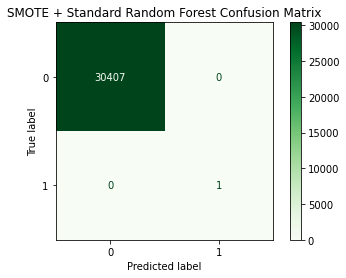

In [ ]:
#Randomly spilt dataset to test and train set
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.2, stratify=y_smote) #--> test on original (non-oversampled dataset)
#Train SMOTE SRF on oversampled dataset
SMOTE_SRF.fit(over_X_train, over_y_train) 
#SMOTE SRF prediction result on original test dataset
y_pred = SMOTE_SRF.predict(X_test)
#Create confusion matrix
fig = plot_confusion_matrix(SMOTE_SRF, X_test, y_test, cmap='Greens', values_format = '')
plt.title('SMOTE + Standard Random Forest Confusion Matrix')
plt.show()

In [ ]:
# save
#joblib.dump(SMOTE_SRF, "models/smote_random_forest.joblib")
joblib.dump(SMOTE_SRF, "models/smote_random_forest_20230202.joblib")

['models/smote_random_forest_20230202.joblib']

In [ ]:
# load, no need to initialize the loaded_rf
loaded_rf = joblib.load("models/smote_random_forest_20230202.joblib")

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


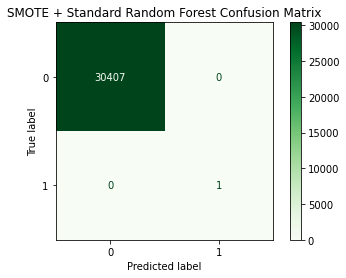

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.2, stratify=y_smote)
y_pred = loaded_rf.predict(X_test)
fig = plot_confusion_matrix(loaded_rf, X_test, y_test, cmap='Greens', values_format = '')
plt.title('SMOTE + Standard Random Forest Confusion Matrix')
plt.show()

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


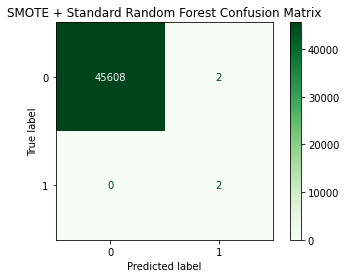

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.3, stratify=y_smote) #--
y_pred = loaded_rf.predict(X_test)
fig = plot_confusion_matrix(loaded_rf, X_test, y_test, cmap='Greens')
plt.title('SMOTE + Standard Random Forest Confusion Matrix')
plt.show()

In [ ]:
#test set contains the last 2 failures
for failure in failures_row_id:
  print(failure in list(y_test.index))

False
False
False
False
True
True


Text(0.5, 0, 'Feature Importance')

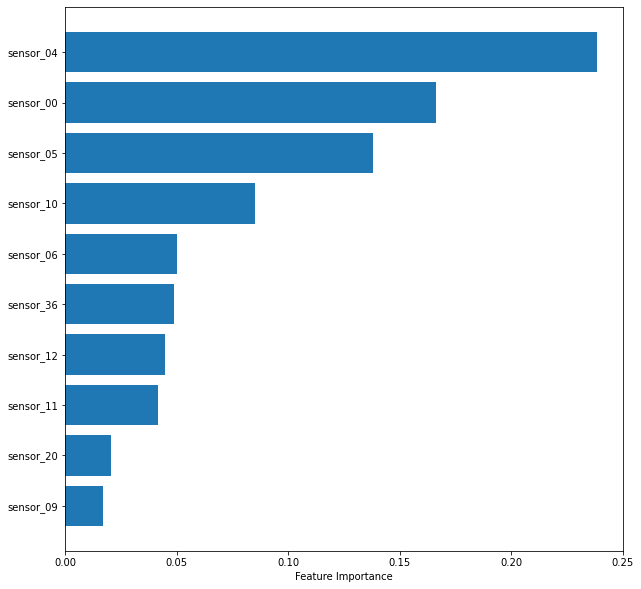

In [ ]:
top_n_features = 10

importances_sfr = loaded_rf.feature_importances_
sorted_idx_sfr = loaded_rf.feature_importances_.argsort()
plt.figure(figsize=(10,10))
plt.barh(over_X_train.columns[sorted_idx_sfr][-top_n_features:], loaded_rf.feature_importances_[sorted_idx_sfr][-top_n_features:])
plt.xlabel("Feature Importance")

In [ ]:
top10sensors_smote = list(over_X_train.columns[sorted_idx_sfr][-top_n_features:])

### **Merge important features**

In [ ]:
print(top10sensors_smote)

['sensor_09', 'sensor_20', 'sensor_11', 'sensor_12', 'sensor_36', 'sensor_06', 'sensor_10', 'sensor_05', 'sensor_00', 'sensor_04']


In [ ]:
print(top10sensors_rf)

['sensor_40', 'sensor_06', 'sensor_48', 'sensor_01', 'sensor_00', 'sensor_13', 'sensor_04', 'sensor_11', 'sensor_10', 'sensor_12']


In [ ]:
list(set(top10sensors_smote).intersection(set(top10sensors_rf))) 

['sensor_00', 'sensor_11', 'sensor_12', 'sensor_10', 'sensor_06', 'sensor_04']

### **Feature selection**

We trained two models and analyzed the top 10 most important features among ***ALL the sensors*** in order to:
- separate NORMAL from ABNORMAL (= RECOVERING + BROKEN) states (Random Forest)
- isolate BROKEN occurrences (SMOTE random forest)

We have an overlapping of 6 features, corresponding to **6 sensors that both models detected among the most important** when the machine is not working properly.

Therefore, we are going to use these 6 process variables for feature engineering and pump failure model prediction.
<br>
<br>


In [ ]:
#TEMP (retrieve relevant features from previous steps)
top10sensors_smote = ['sensor_09', 'sensor_20', 'sensor_11', 'sensor_12', 'sensor_36', 'sensor_06', 'sensor_10', 'sensor_00', 'sensor_05', 'sensor_04']
top10sensors_rf = ['sensor_40', 'sensor_06', 'sensor_48', 'sensor_01', 'sensor_00', 'sensor_13', 'sensor_04', 'sensor_11', 'sensor_10', 'sensor_12']

In [ ]:
selected_features = list(set(top10sensors_smote).intersection(set(top10sensors_rf))) 
print(selected_features)

['sensor_06', 'sensor_04', 'sensor_11', 'sensor_00', 'sensor_10', 'sensor_12']


# **Narrowed dataset**

In [ ]:
df_pre.columns

Index(['timestamp', 'sensor_00', 'sensor_01', 'sensor_02', 'sensor_03',
       'sensor_04', 'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08',
       'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13',
       'sensor_14', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19',
       'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24',
       'sensor_25', 'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29',
       'sensor_30', 'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34',
       'sensor_35', 'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39',
       'sensor_40', 'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44',
       'sensor_45', 'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49',
       'operation'],
      dtype='object')

In [ ]:
time = ['timestamp']
num_variables =  selected_features
target = ['operation']

In [ ]:
df_n = df_pre[time + num_variables + target].copy()

In [ ]:
df_n['failure'] = np.where(df_n['operation'] == 0, 1, 0) # operation = 0 for BROKEN, 0.5 for RECOVERING, 1 for NORMAL

In [ ]:
df_n.head()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure
0,2018-04-01 00:00:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0
1,2018-04-01 00:01:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0
2,2018-04-01 00:02:00,13.32465,638.8889,48.17723,2.444734,37.86777,32.08894,1.0,0
3,2018-04-01 00:03:00,13.31742,628.1250,48.65607,2.460474,38.57977,31.67221,1.0,0
4,2018-04-01 00:04:00,13.35359,636.4583,49.06298,2.445718,39.48939,31.95202,1.0,0


In [ ]:
df_n['failure'].sum()

6

In [ ]:
df_n.shape

(166440, 9)

# **Feature engineering**

Before training a model to predict pump failure in advance, we enrich the dataset with some features that may be relevant according to the initial exploratory data analysis.
<br>
<br>
> We are going to calculate the following features to enrich the dataset


*   **Extraordinary maintenance**: flag as extraordinary maintenance if the last NORMAL duration is less than 5 days; rows corresponding to NORMAL state after an extraordinary maintenance are flagged with *post_extra_m*=1 
*   **Time From Failure (TFF)**: minutes from last failure
 * **Time From Failure (TFF) bucket** width of *5 days*, since from historical observation 5 days is a reasonable threshold for detecting extraordinary maintenance and the same "step" can be maintained to analyze MTBF
* **Time To Failure (TTF)**: minutes to the next failure (requires to drop rows after the last failure)
<br>
<br>

> Feature engineering entails **design choices** that should be optimized talking with subject matter experts and analyzing model performance.





In [ ]:
df_n['row_id'] = df_n.index

In [ ]:
df_status_transitions

,row_id,timestamp_dt,machine_status,duration,minutes,hours,days
0,0,2018-04-01 00:00:00,NORMAL,11 days 21:55:00,17155.0,285.916667,11.913194
1,17155,2018-04-12 21:55:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694
2,17156,2018-04-12 21:56:00,RECOVERING,0 days 15:44:00,944.0,15.733333,0.655556
3,18100,2018-04-13 13:40:00,NORMAL,4 days 10:50:00,6410.0,106.833333,4.451389
4,24510,2018-04-18 00:30:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694
5,24511,2018-04-18 00:31:00,RECOVERING,2 days 03:50:00,3110.0,51.833333,2.159722
6,27621,2018-04-20 04:21:00,NORMAL,28 days 22:57:00,41697.0,694.950000,28.956250
7,69318,2018-05-19 03:18:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694
8,69319,2018-05-19 03:19:00,RECOVERING,0 days 21:52:00,1312.0,21.866667,0.911111
9,70631,2018-05-20 01:11:00,NORMAL,4 days 23:19:00,7159.0,119.316667,4.971528


### **Extraordinary maintenance**

In [ ]:
df_status_transitions["last_normal"] = df_status_transitions["duration"].shift(2)
df_status_transitions

,row_id,timestamp_dt,machine_status,duration,minutes,hours,days,last_normal
0,0,2018-04-01 00:00:00,NORMAL,11 days 21:55:00,17155.0,285.916667,11.913194,NaT
1,17155,2018-04-12 21:55:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694,NaT
2,17156,2018-04-12 21:56:00,RECOVERING,0 days 15:44:00,944.0,15.733333,0.655556,11 days 21:55:00
3,18100,2018-04-13 13:40:00,NORMAL,4 days 10:50:00,6410.0,106.833333,4.451389,0 days 00:01:00
4,24510,2018-04-18 00:30:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694,0 days 15:44:00
5,24511,2018-04-18 00:31:00,RECOVERING,2 days 03:50:00,3110.0,51.833333,2.159722,4 days 10:50:00
6,27621,2018-04-20 04:21:00,NORMAL,28 days 22:57:00,41697.0,694.950000,28.956250,0 days 00:01:00
7,69318,2018-05-19 03:18:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694,2 days 03:50:00
8,69319,2018-05-19 03:19:00,RECOVERING,0 days 21:52:00,1312.0,21.866667,0.911111,28 days 22:57:00
9,70631,2018-05-20 01:11:00,NORMAL,4 days 23:19:00,7159.0,119.316667,4.971528,0 days 00:01:00


In [ ]:
#flag as extraordinary maintenance if the last NORMAL duration is less than 5 days
df_status_transitions["extra_m"] = 0
#df_status_transitions["test"] = df_status_transitions["last_normal"]/ np.timedelta64(1, 'D')
#df_status_transitions["test2"] = (df_status_transitions["last_normal"]/ np.timedelta64(1, 'D'))<5
df_status_transitions.loc[(df_status_transitions['machine_status'] == "RECOVERING")&((df_status_transitions["last_normal"]/ np.timedelta64(1, 'D'))<5), 'extra_m'] = 1
df_status_transitions

,row_id,timestamp_dt,machine_status,duration,minutes,hours,days,last_normal,extra_m
0,0,2018-04-01 00:00:00,NORMAL,11 days 21:55:00,17155.0,285.916667,11.913194,NaT,0
1,17155,2018-04-12 21:55:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694,NaT,0
2,17156,2018-04-12 21:56:00,RECOVERING,0 days 15:44:00,944.0,15.733333,0.655556,11 days 21:55:00,0
3,18100,2018-04-13 13:40:00,NORMAL,4 days 10:50:00,6410.0,106.833333,4.451389,0 days 00:01:00,0
4,24510,2018-04-18 00:30:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694,0 days 15:44:00,0
5,24511,2018-04-18 00:31:00,RECOVERING,2 days 03:50:00,3110.0,51.833333,2.159722,4 days 10:50:00,1
6,27621,2018-04-20 04:21:00,NORMAL,28 days 22:57:00,41697.0,694.950000,28.956250,0 days 00:01:00,0
7,69318,2018-05-19 03:18:00,BROKEN,0 days 00:01:00,1.0,0.016667,0.000694,2 days 03:50:00,0
8,69319,2018-05-19 03:19:00,RECOVERING,0 days 21:52:00,1312.0,21.866667,0.911111,28 days 22:57:00,0
9,70631,2018-05-20 01:11:00,NORMAL,4 days 23:19:00,7159.0,119.316667,4.971528,0 days 00:01:00,0


In [ ]:
#extra_m working hours from row [27621:69318] and [78396:128040]
df_n["post_extra_m"] = 0
df_n.loc[(df_n['row_id'] >= 27621)&(df_n["row_id"]<=69318), 'post_extra_m'] = 1
df_n.loc[(df_n['row_id'] >= 78396)&(df_n["row_id"]<=128040), 'post_extra_m'] = 1
df_n.head()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m
0,2018-04-01 00:00:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,0,0
1,2018-04-01 00:01:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,1,0
2,2018-04-01 00:02:00,13.32465,638.8889,48.17723,2.444734,37.86777,32.08894,1.0,0,2,0
3,2018-04-01 00:03:00,13.31742,628.1250,48.65607,2.460474,38.57977,31.67221,1.0,0,3,0
4,2018-04-01 00:04:00,13.35359,636.4583,49.06298,2.445718,39.48939,31.95202,1.0,0,4,0


In [ ]:
df_n[(df_n['timestamp'] >= '2018-04-20 04:21:00')].head(10)

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m
27621,2018-04-20 04:21:00,5.070891,123.399879,0.000000,0.306945,4.307125,0.0,1.0,0,27621,1
27622,2018-04-20 04:22:00,5.020255,122.126732,0.000000,0.306945,4.609156,0.0,1.0,0,27622,1
27623,2018-04-20 04:23:00,5.056424,124.094322,0.000000,0.304977,8.558763,0.0,1.0,0,27623,1
27624,2018-04-20 04:24:00,5.063657,121.316551,0.004960,0.304977,8.722272,0.0,1.0,0,27624,1
27625,2018-04-20 04:25:00,5.041956,122.936913,1.018368,0.305961,9.210608,0.0,1.0,0,27625,1
27626,2018-04-20 04:26:00,5.041956,122.242477,1.764883,0.304977,9.487507,0.0,1.0,0,27626,1
27627,2018-04-20 04:27:00,5.078125,123.399887,2.188653,0.304977,9.348927,0.0,1.0,0,27627,1
27628,2018-04-20 04:28:00,5.063657,123.284142,2.268166,0.304977,8.912122,0.0,1.0,0,27628,1
27629,2018-04-20 04:29:00,5.027488,123.515617,1.772422,0.306945,3.483223,0.0,1.0,0,27629,1
27630,2018-04-20 04:30:00,5.041956,123.284100,1.244164,0.304977,3.155827,0.0,1.0,0,27630,1


In [ ]:
df_n.failure.sum()

6

### **TFF calculation**

In [ ]:
tff = df_n['failure'].cumsum()
df_n['tff'] = tff.groupby(tff).cumcount()

In [ ]:
#row_id for failures
list(df_n[df_n['failure']==1].row_id)

[17155, 24510, 69318, 77790, 128040, 141131]

In [ ]:
df_n[24500:24520]

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff
24500,2018-04-18 00:20:00,13.628470,199.999985,41.03670,1.880035,37.788710,33.766010,1.0,0,24500,0,7345
24501,2018-04-18 00:21:00,13.628470,199.999985,41.03670,1.880035,37.788710,33.766010,1.0,0,24501,0,7346
24502,2018-04-18 00:22:00,13.650170,201.177658,40.39317,1.715741,31.510810,31.811740,1.0,0,24502,0,7347
24503,2018-04-18 00:23:00,12.311920,201.640625,38.86986,1.639988,30.707380,30.913720,1.0,0,24503,0,7348
24504,2018-04-18 00:24:00,12.398730,199.904510,35.31089,1.624248,30.809880,24.410770,1.0,0,24504,0,7349
24505,2018-04-18 00:25:00,12.398730,200.367462,34.25265,1.443229,31.076630,24.067750,1.0,0,24505,0,7350
24506,2018-04-18 00:26:00,12.333620,200.946167,33.40912,1.441262,31.241250,23.526590,1.0,0,24506,0,7351
24507,2018-04-18 00:27:00,12.311920,200.483215,32.59974,1.437326,31.109910,22.993520,1.0,0,24507,0,7352
24508,2018-04-18 00:28:00,12.507230,199.788773,31.78583,1.445197,30.861500,21.956750,1.0,0,24508,0,7353
24509,2018-04-18 00:29:00,12.369790,201.061920,31.27275,1.435359,30.889650,21.545050,1.0,0,24509,0,7354


### **TFF encoding**

In [ ]:
# TFF categories based on duration in DAYS
df_n["tff_label"] = \
  np.where((df_n["tff"]/ 1440)<5, '<5', \
   np.where((df_n["tff"]/ 1440)<10, '5-10', \
    np.where((df_n["tff"]/ 1440)<15, '10-15', \
     np.where((df_n["tff"]/ 1440)<20, '15-20', \
      np.where((df_n["tff"]/ 1440)<25, '20-25', '>25' \
    )))))

In [ ]:
df_n["tff_encoding"] = \
  np.where((df_n["tff"]/ 1440)<5, 1, \
   np.where((df_n["tff"]/ 1440)<10, 2, \
    np.where((df_n["tff"]/ 1440)<15, 3, \
     np.where((df_n["tff"]/ 1440)<20, 4, \
      np.where((df_n["tff"]/ 1440)<25, 5, 6 \
    )))))

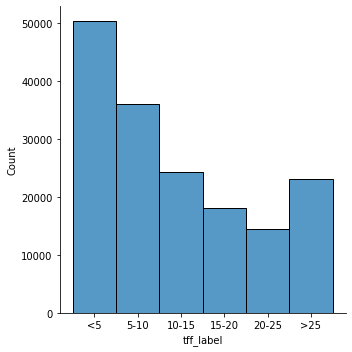

In [ ]:
sns.displot(df_n["tff_label"])

In [ ]:
df_n[17145:17165]

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding
17145,2018-04-12 21:45:00,13.418690,393.634247,52.470210,2.389641,45.545520,15.137140,1.0,0,17145,0,17145,10-15,3
17146,2018-04-12 21:46:00,13.353590,154.146408,26.886520,2.278472,43.608430,15.204680,1.0,0,17146,0,17146,10-15,3
17147,2018-04-12 21:47:00,13.230610,133.313065,25.344910,2.282408,42.165490,15.208720,1.0,0,17147,0,17147,10-15,3
17148,2018-04-12 21:48:00,13.252310,131.924179,25.807800,1.858391,41.590710,15.236410,1.0,0,17148,0,17148,10-15,3
17149,2018-04-12 21:49:00,13.317420,133.544556,26.186800,1.834780,40.369380,15.170040,1.0,0,17149,0,17149,10-15,3
17150,2018-04-12 21:50:00,13.172740,110.975121,28.723700,1.533738,39.397060,15.244610,1.0,0,17150,0,17150,10-15,3
17151,2018-04-12 21:51:00,13.201680,110.512154,28.343960,1.349769,41.032480,15.191060,1.0,0,17151,0,17151,10-15,3
17152,2018-04-12 21:52:00,13.498260,112.595482,28.638560,1.290741,43.651220,15.264060,1.0,0,17152,0,17152,10-15,3
17153,2018-04-12 21:53:00,13.252310,113.174187,28.347830,1.220891,45.390770,15.239870,1.0,0,17153,0,17153,10-15,3
17154,2018-04-12 21:54:00,5.758102,117.109375,16.553430,0.000000,17.726180,6.379962,1.0,0,17154,0,17154,10-15,3


In [ ]:
df_n.shape

(166440, 14)

### **TTF calculation**

In [ ]:
ttf = df_n['failure'].iloc[::-1].cumsum()
df_n['ttf'] = ttf.groupby(ttf).cumcount()

In [ ]:
df_n[17145:17165]

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf
17145,2018-04-12 21:45:00,13.418690,393.634247,52.470210,2.389641,45.545520,15.137140,1.0,0,17145,0,17145,10-15,3,10
17146,2018-04-12 21:46:00,13.353590,154.146408,26.886520,2.278472,43.608430,15.204680,1.0,0,17146,0,17146,10-15,3,9
17147,2018-04-12 21:47:00,13.230610,133.313065,25.344910,2.282408,42.165490,15.208720,1.0,0,17147,0,17147,10-15,3,8
17148,2018-04-12 21:48:00,13.252310,131.924179,25.807800,1.858391,41.590710,15.236410,1.0,0,17148,0,17148,10-15,3,7
17149,2018-04-12 21:49:00,13.317420,133.544556,26.186800,1.834780,40.369380,15.170040,1.0,0,17149,0,17149,10-15,3,6
17150,2018-04-12 21:50:00,13.172740,110.975121,28.723700,1.533738,39.397060,15.244610,1.0,0,17150,0,17150,10-15,3,5
17151,2018-04-12 21:51:00,13.201680,110.512154,28.343960,1.349769,41.032480,15.191060,1.0,0,17151,0,17151,10-15,3,4
17152,2018-04-12 21:52:00,13.498260,112.595482,28.638560,1.290741,43.651220,15.264060,1.0,0,17152,0,17152,10-15,3,3
17153,2018-04-12 21:53:00,13.252310,113.174187,28.347830,1.220891,45.390770,15.239870,1.0,0,17153,0,17153,10-15,3,2
17154,2018-04-12 21:54:00,5.758102,117.109375,16.553430,0.000000,17.726180,6.379962,1.0,0,17154,0,17154,10-15,3,1


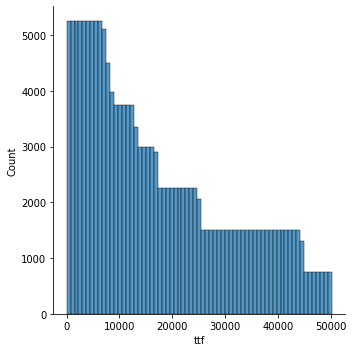

In [ ]:
sns.displot(df_n['ttf'])

### **Remove data after last failure**

In [ ]:
df_n[df_n['failure']==True] #.tail()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf
17155,2018-04-12 21:55:00,3.219039,202.526031,3.625588,0.000000,35.530850,1.602259,0.0,1,17155,0,0,<5,1,0
24510,2018-04-18 00:30:00,12.304690,206.038757,30.434710,1.093982,28.304880,21.437910,0.0,1,24510,0,0,<5,1,0
69318,2018-05-19 03:18:00,13.592300,200.115738,43.623220,2.258796,43.998860,22.736040,0.0,1,69318,1,0,<5,1,0
77790,2018-05-25 00:30:00,14.062500,612.152800,44.793620,2.321759,27.092980,32.745590,0.0,1,77790,0,0,<5,1,0
128040,2018-06-28 22:00:00,11.335360,201.368622,1.960537,0.364005,2.002474,0.000000,0.0,1,128040,1,0,<5,1,0
141131,2018-07-08 00:11:00,0.028935,500.000000,23.970270,0.001968,25.977650,19.995600,0.0,1,141131,0,0,<5,1,0


In [ ]:
max_row_id = df_n[df_n['failure']==True]['row_id'].max()
max_row_id

141131

In [ ]:
df_no_tail = df_n[:max_row_id+1]
df_no_tail.tail()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf
141127,2018-07-08 00:07:00,0.028935,552.3148,41.69363,0.305961,33.43283,29.12391,1.0,0,141127,0,13087,5-10,2,4
141128,2018-07-08 00:08:00,0.028935,552.3148,41.69363,0.305961,33.43283,29.12391,1.0,0,141128,0,13088,5-10,2,3
141129,2018-07-08 00:09:00,0.028935,550.4630,30.90153,1.172685,21.92094,17.57354,1.0,0,141129,0,13089,5-10,2,2
141130,2018-07-08 00:10:00,0.028935,490.0463,14.77553,0.000000,19.46683,11.12693,1.0,0,141130,0,13090,5-10,2,1
141131,2018-07-08 00:11:00,0.028935,500.0000,23.97027,0.001968,25.97765,19.99560,0.0,1,141131,0,0,<5,1,0


In [ ]:
df_no_tail['failure'].sum()/df_no_tail['failure'].count()

4.2513391718391296e-05

In [ ]:
df_no_tail.agg({'failure':'sum', 'row_id':'count'})

failure         6
row_id     141132
dtype: int64

In [ ]:
df_no_tail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141132 entries, 0 to 141131
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   timestamp     141132 non-null  datetime64[ns]
 1   sensor_06     141132 non-null  float64       
 2   sensor_04     141132 non-null  float64       
 3   sensor_11     141132 non-null  float64       
 4   sensor_00     141132 non-null  float64       
 5   sensor_10     141132 non-null  float64       
 6   sensor_12     141132 non-null  float64       
 7   operation     141132 non-null  float64       
 8   failure       141132 non-null  int64         
 9   row_id        141132 non-null  int64         
 10  post_extra_m  141132 non-null  int64         
 11  tff           141132 non-null  int64         
 12  tff_label     141132 non-null  object        
 13  tff_encoding  141132 non-null  int64         
 14  ttf           141132 non-null  int64         
dtypes: datetime64[ns]

# **Failure prediction model**

After completing data preprocessing and feature engineering, the dataset is ready for ML model development. 

In this step we shift the problem from simultaneous binary-class classification to **look-forward multi-class classification**.


**Time to Failure (TFF) labels** are designed in order to provide a sort of *Risk index* within the current shift (8 hours) and therefore
- SHORT TERM FAILURE (< 3 hours)
- MID TERM FAILURE (3-5 hours)
- LONG TERM FAILURE (5-8 hours)
- EVALUATE DURING NEXT SHIFT FAILURE (> 8 hours)

<br>
<br>

> The design choice for ***TTF target label*** highly impacts model utilization and should take into account specific **production enviroment properties** (e.g. shift duration, maintenance operator availability, physical description of the system, penalties for unscheduled stoppages).

### **TTF label**

In [ ]:
df_ttf = df_no_tail.copy()

In [ ]:
df_ttf.loc[:,"ttf_label"] = \
  np.where(df_ttf['ttf'] < 180, '< 3h', \
    np.where(df_ttf['ttf'] < 300, '3-5h', \
      np.where(df_ttf['ttf'] < 480, '5-8h', \
              np.where(df_ttf['ttf'] < 960, '8-16h', '> 16h') \
    )
  )
  )

In [ ]:
df_ttf.tail()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
141127,2018-07-08 00:07:00,0.028935,552.3148,41.69363,0.305961,33.43283,29.12391,1.0,0,141127,0,13087,5-10,2,4,< 3h
141128,2018-07-08 00:08:00,0.028935,552.3148,41.69363,0.305961,33.43283,29.12391,1.0,0,141128,0,13088,5-10,2,3,< 3h
141129,2018-07-08 00:09:00,0.028935,550.4630,30.90153,1.172685,21.92094,17.57354,1.0,0,141129,0,13089,5-10,2,2,< 3h
141130,2018-07-08 00:10:00,0.028935,490.0463,14.77553,0.000000,19.46683,11.12693,1.0,0,141130,0,13090,5-10,2,1,< 3h
141131,2018-07-08 00:11:00,0.028935,500.0000,23.97027,0.001968,25.97765,19.99560,0.0,1,141131,0,0,<5,1,0,< 3h


In [ ]:
df_ttf.head()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
0,2018-04-01 00:00:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,0,0,0,<5,1,17155,> 16h
1,2018-04-01 00:01:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,1,0,1,<5,1,17154,> 16h
2,2018-04-01 00:02:00,13.32465,638.8889,48.17723,2.444734,37.86777,32.08894,1.0,0,2,0,2,<5,1,17153,> 16h
3,2018-04-01 00:03:00,13.31742,628.1250,48.65607,2.460474,38.57977,31.67221,1.0,0,3,0,3,<5,1,17152,> 16h
4,2018-04-01 00:04:00,13.35359,636.4583,49.06298,2.445718,39.48939,31.95202,1.0,0,4,0,4,<5,1,17151,> 16h


In [ ]:
df_ttf.shape

(141132, 16)

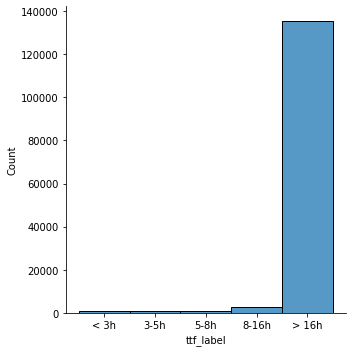

In [ ]:
sns.displot(df_ttf.sort_values(by = 'ttf')['ttf_label'])

In [ ]:
df_ttf.groupby('ttf_label')['row_id'].count()

ttf_label
3-5h        720
5-8h       1080
8-16h      2880
< 3h       1080
> 16h    135372
Name: row_id, dtype: int64

In [ ]:
df_ttf.groupby(['ttf_label','operation'])['row_id'].count()

ttf_label  operation
3-5h       1.0             720
5-8h       1.0            1080
8-16h      1.0            2880
< 3h       0.0               6
           1.0            1074
> 16h      0.5           14361
           1.0          121011
Name: row_id, dtype: int64

### **Filter TTF**

In [ ]:
df_ttf.head()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
0,2018-04-01 00:00:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,0,0,0,<5,1,17155,> 16h
1,2018-04-01 00:01:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,1,0,1,<5,1,17154,> 16h
2,2018-04-01 00:02:00,13.32465,638.8889,48.17723,2.444734,37.86777,32.08894,1.0,0,2,0,2,<5,1,17153,> 16h
3,2018-04-01 00:03:00,13.31742,628.1250,48.65607,2.460474,38.57977,31.67221,1.0,0,3,0,3,<5,1,17152,> 16h
4,2018-04-01 00:04:00,13.35359,636.4583,49.06298,2.445718,39.48939,31.95202,1.0,0,4,0,4,<5,1,17151,> 16h


In [ ]:
df_ttf.shape

(141132, 16)

In [ ]:
df_ttf["row_id"] = range(df_ttf.shape[0])

In [ ]:
df_ttf[df_ttf.failure==1]

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
17155,2018-04-12 21:55:00,3.219039,202.526031,3.625588,0.000000,35.530850,1.602259,0.0,1,17155,0,0,<5,1,0,< 3h
24510,2018-04-18 00:30:00,12.304690,206.038757,30.434710,1.093982,28.304880,21.437910,0.0,1,24510,0,0,<5,1,0,< 3h
69318,2018-05-19 03:18:00,13.592300,200.115738,43.623220,2.258796,43.998860,22.736040,0.0,1,69318,1,0,<5,1,0,< 3h
77790,2018-05-25 00:30:00,14.062500,612.152800,44.793620,2.321759,27.092980,32.745590,0.0,1,77790,0,0,<5,1,0,< 3h
128040,2018-06-28 22:00:00,11.335360,201.368622,1.960537,0.364005,2.002474,0.000000,0.0,1,128040,1,0,<5,1,0,< 3h
141131,2018-07-08 00:11:00,0.028935,500.000000,23.970270,0.001968,25.977650,19.995600,0.0,1,141131,0,0,<5,1,0,< 3h


In [ ]:
df_ttf.head()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
0,2018-04-01 00:00:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,0,0,0,<5,1,17155,> 16h
1,2018-04-01 00:01:00,13.41146,634.3750,47.52422,2.465394,37.22740,31.11716,1.0,0,1,0,1,<5,1,17154,> 16h
2,2018-04-01 00:02:00,13.32465,638.8889,48.17723,2.444734,37.86777,32.08894,1.0,0,2,0,2,<5,1,17153,> 16h
3,2018-04-01 00:03:00,13.31742,628.1250,48.65607,2.460474,38.57977,31.67221,1.0,0,3,0,3,<5,1,17152,> 16h
4,2018-04-01 00:04:00,13.35359,636.4583,49.06298,2.445718,39.48939,31.95202,1.0,0,4,0,4,<5,1,17151,> 16h


In [ ]:
df_ts = df_ttf[df_ttf['ttf'] <= 1000] #960 minutes = 16 hours = 2 shifts // 960 min labeling + 40 min lookback size
#df_ts = df_ttf[df_ttf['operation']!=0.5]  #960 minutes before failures data do not contain RECOVERING state
df_ts.reset_index(drop=True, inplace=True)

In [ ]:
df_ts.shape

(6006, 16)

In [ ]:
df_ts[df_ts.failure==1]

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
1000,2018-04-12 21:55:00,3.219039,202.526031,3.625588,0.000000,35.530850,1.602259,0.0,1,17155,0,0,<5,1,0,< 3h
2001,2018-04-18 00:30:00,12.304690,206.038757,30.434710,1.093982,28.304880,21.437910,0.0,1,24510,0,0,<5,1,0,< 3h
3002,2018-05-19 03:18:00,13.592300,200.115738,43.623220,2.258796,43.998860,22.736040,0.0,1,69318,1,0,<5,1,0,< 3h
4003,2018-05-25 00:30:00,14.062500,612.152800,44.793620,2.321759,27.092980,32.745590,0.0,1,77790,0,0,<5,1,0,< 3h
5004,2018-06-28 22:00:00,11.335360,201.368622,1.960537,0.364005,2.002474,0.000000,0.0,1,128040,1,0,<5,1,0,< 3h
6005,2018-07-08 00:11:00,0.028935,500.000000,23.970270,0.001968,25.977650,19.995600,0.0,1,141131,0,0,<5,1,0,< 3h


In [ ]:
#no recovering state
df_ts.operation.unique()

array([1., 0.])

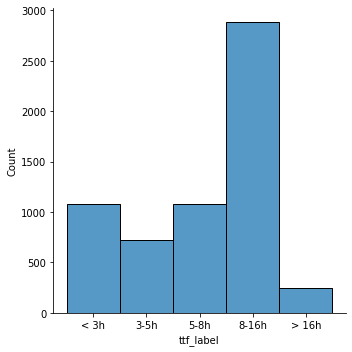

In [ ]:
sns.displot(df_ts.sort_values(by = 'ttf')['ttf_label']);

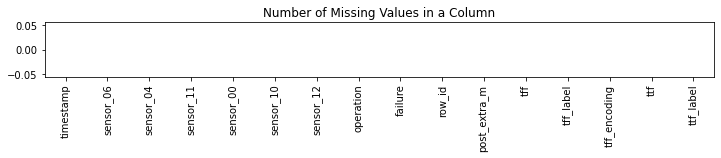

In [ ]:
df_ts.isnull().sum().plot(kind='bar', figsize=(12,1));
plt.title('Number of Missing Values in a Column');

In [ ]:
df_ts.groupby(['ttf_label','operation'])['row_id'].count()

ttf_label  operation
3-5h       1.0           720
5-8h       1.0          1080
8-16h      1.0          2880
< 3h       0.0             6
           1.0          1074
> 16h      1.0           246
Name: row_id, dtype: int64

### **Feature shifting**

In [ ]:
from collections import deque
import random

In [ ]:
df_ts.head()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
0,2018-04-12 05:15:00,13.59954,629.2824,48.59478,2.454572,35.95946,36.79762,1.0,0,16155,0,16155,10-15,3,1000,> 16h
1,2018-04-12 05:16:00,13.61400,639.3519,48.23777,2.459491,36.70186,36.33726,1.0,0,16156,0,16156,10-15,3,999,> 16h
2,2018-04-12 05:17:00,13.59230,637.8472,47.70694,2.451620,36.79974,35.34019,1.0,0,16157,0,16157,10-15,3,998,> 16h
3,2018-04-12 05:18:00,13.55613,634.3750,46.86923,2.459491,37.74342,34.63626,1.0,0,16158,0,16158,10-15,3,997,> 16h
4,2018-04-12 05:19:00,13.52720,645.4861,46.85873,2.449653,36.72395,34.92826,1.0,0,16159,0,16159,10-15,3,996,> 16h


In [ ]:
list(df_ts[df_ts.failure==1].index)

[1000, 2001, 3002, 4003, 5004, 6005]

In [ ]:
time = ["timestamp"]
features = selected_features + ["tff_encoding","post_extra_m"]
target = ["ttf_label"]
row_id = ["row_id"]

In [ ]:
df_ml = df_ts[time + features + row_id + target].copy()
df_ml.head()

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,tff_encoding,post_extra_m,row_id,ttf_label
0,2018-04-12 05:15:00,13.59954,629.2824,48.59478,2.454572,35.95946,36.79762,3,0,16155,> 16h
1,2018-04-12 05:16:00,13.61400,639.3519,48.23777,2.459491,36.70186,36.33726,3,0,16156,> 16h
2,2018-04-12 05:17:00,13.59230,637.8472,47.70694,2.451620,36.79974,35.34019,3,0,16157,> 16h
3,2018-04-12 05:18:00,13.55613,634.3750,46.86923,2.459491,37.74342,34.63626,3,0,16158,> 16h
4,2018-04-12 05:19:00,13.52720,645.4861,46.85873,2.449653,36.72395,34.92826,3,0,16159,> 16h


In [ ]:
df_ml.shape

(6006, 11)

In [ ]:
df_ml.to_numpy()[0]

array([Timestamp('2018-04-12 05:15:00'), 13.59954, 629.2824, 48.59478,
       2.454572, 35.95946, 36.79762, 3, 0, 16155, '> 16h'], dtype=object)

In [ ]:
len(df_ml.to_numpy()[0]) # = nr of columns of original dataset

11

In [ ]:
len(df_ml.to_numpy())

6006

In [ ]:
LOOKBACK_SIZE = 40

In [ ]:
seq_data = []
prev_data = deque(maxlen=LOOKBACK_SIZE)
for row in df_ml.to_numpy():
  prev_data.append([columns for columns in row[1:-4]]) #exclude first column (timestamp) and last 4 columns (ttf_label, post_extra_m, tff_encoding and row_id)
  if len(prev_data) == LOOKBACK_SIZE:
    seq_data.append([np.array(prev_data), row[-4:]]) #append to seq_data a record with the last LOOKBACK_SIZE sensors value + tff_encoding + post_extra_m + row_id + ttf_label

#random.shuffle(seq_data)

In [ ]:
len(seq_data)

5967

In [ ]:
#first row_id = 16235 while first row_id in df_ml is 16196 (delta = LOOKBACK_SIZE)
seq_data[0]

[array([[ 13.59954 , 629.2824  ,  48.59478 ,   2.454572,  35.95946 ,
          36.79762 ],
        [ 13.614   , 639.3519  ,  48.23777 ,   2.459491,  36.70186 ,
          36.33726 ],
        [ 13.5923  , 637.8472  ,  47.70694 ,   2.45162 ,  36.79974 ,
          35.34019 ],
        [ 13.55613 , 634.375   ,  46.86923 ,   2.459491,  37.74342 ,
          34.63626 ],
        [ 13.5272  , 645.4861  ,  46.85873 ,   2.449653,  36.72395 ,
          34.92826 ],
        [ 13.5923  , 634.0278  ,  46.80311 ,   2.459491,  36.4524  ,
          33.80935 ],
        [ 13.65017 , 632.0602  ,  46.23009 ,   2.444734,  35.98668 ,
          33.8417  ],
        [ 13.64294 , 630.0926  ,  45.48706 ,   2.456539,  35.17484 ,
          34.75074 ],
        [ 13.5923  , 648.6111  ,  45.43126 ,   2.449653,  35.21412 ,
          35.35997 ],
        [ 13.71528 , 648.6111  ,  45.49708 ,   2.456539,  35.47261 ,
          35.58253 ],
        [ 13.56337 , 628.588   ,  45.71634 ,   2.456539,  35.59027 ,
          36.71928 ],

In [ ]:
seq_data[0][1][3]

'> 16h'

In [ ]:
for seq, target in seq_data[0:5]:
  print(target)
  if(target[3] == '> 16h'):
    print("1")

[3 0 16194 '> 16h']
1
[3 0 16195 '> 16h']
1
[3 0 16196 '8-16h']
[3 0 16197 '8-16h']
[3 0 16198 '8-16h']


In [ ]:
X = []
y = []
y_dis = []

y_dict = {
    "< 3h": [1.0, 0.0, 0.0, 0.0],
    "3-5h": [0.0, 1.0, 0.0, 0.0],
    "5-8h": [0.0, 0.0, 1.0, 0.0],
    "8-16h": [0.0, 0.0, 0.0, 1.0]
}

In [ ]:
for seq, target in seq_data:
  if(target[3] != '> 16h'):
    X.append(np.append(np.append(seq.flatten(),target[0]),target[1:3])) 
    y.append(y_dict[target[3]])
    y_dis.append(target[3])

In [ ]:
train_x = np.array(X)
train_y = np.array(y)

In [ ]:
train_x.shape

(5760, 243)

In [ ]:
train_y.shape

(5760, 4)

In [ ]:
offset = LOOKBACK_SIZE - 1
seq_twa_columns = []

while offset >= 0:
  for feature in selected_features:
    seq_twa_columns.append(f"{feature}_{offset}")
  offset -= 1

print(seq_twa_columns)

['sensor_06_39', 'sensor_04_39', 'sensor_11_39', 'sensor_00_39', 'sensor_10_39', 'sensor_12_39', 'sensor_06_38', 'sensor_04_38', 'sensor_11_38', 'sensor_00_38', 'sensor_10_38', 'sensor_12_38', 'sensor_06_37', 'sensor_04_37', 'sensor_11_37', 'sensor_00_37', 'sensor_10_37', 'sensor_12_37', 'sensor_06_36', 'sensor_04_36', 'sensor_11_36', 'sensor_00_36', 'sensor_10_36', 'sensor_12_36', 'sensor_06_35', 'sensor_04_35', 'sensor_11_35', 'sensor_00_35', 'sensor_10_35', 'sensor_12_35', 'sensor_06_34', 'sensor_04_34', 'sensor_11_34', 'sensor_00_34', 'sensor_10_34', 'sensor_12_34', 'sensor_06_33', 'sensor_04_33', 'sensor_11_33', 'sensor_00_33', 'sensor_10_33', 'sensor_12_33', 'sensor_06_32', 'sensor_04_32', 'sensor_11_32', 'sensor_00_32', 'sensor_10_32', 'sensor_12_32', 'sensor_06_31', 'sensor_04_31', 'sensor_11_31', 'sensor_00_31', 'sensor_10_31', 'sensor_12_31', 'sensor_06_30', 'sensor_04_30', 'sensor_11_30', 'sensor_00_30', 'sensor_10_30', 'sensor_12_30', 'sensor_06_29', 'sensor_04_29', 'sensor

In [ ]:
columns=seq_twa_columns +["tff_encoding","post_extra_m","row_id"]
print(columns)

['sensor_06_39', 'sensor_04_39', 'sensor_11_39', 'sensor_00_39', 'sensor_10_39', 'sensor_12_39', 'sensor_06_38', 'sensor_04_38', 'sensor_11_38', 'sensor_00_38', 'sensor_10_38', 'sensor_12_38', 'sensor_06_37', 'sensor_04_37', 'sensor_11_37', 'sensor_00_37', 'sensor_10_37', 'sensor_12_37', 'sensor_06_36', 'sensor_04_36', 'sensor_11_36', 'sensor_00_36', 'sensor_10_36', 'sensor_12_36', 'sensor_06_35', 'sensor_04_35', 'sensor_11_35', 'sensor_00_35', 'sensor_10_35', 'sensor_12_35', 'sensor_06_34', 'sensor_04_34', 'sensor_11_34', 'sensor_00_34', 'sensor_10_34', 'sensor_12_34', 'sensor_06_33', 'sensor_04_33', 'sensor_11_33', 'sensor_00_33', 'sensor_10_33', 'sensor_12_33', 'sensor_06_32', 'sensor_04_32', 'sensor_11_32', 'sensor_00_32', 'sensor_10_32', 'sensor_12_32', 'sensor_06_31', 'sensor_04_31', 'sensor_11_31', 'sensor_00_31', 'sensor_10_31', 'sensor_12_31', 'sensor_06_30', 'sensor_04_30', 'sensor_11_30', 'sensor_00_30', 'sensor_10_30', 'sensor_12_30', 'sensor_06_29', 'sensor_04_29', 'sensor

In [ ]:
train_df = pd.DataFrame(train_x, columns=columns)
train_df.head()

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id
0,13.5923,637.8472,47.70694,2.45162,36.79974,35.34019,13.55613,634.375,46.86923,2.459491,...,32.99364,13.59954,634.1436,46.43915,2.459491,37.88033,33.15711,3.0,0,16196
1,13.55613,634.375,46.86923,2.459491,37.74342,34.63626,13.5272,645.4861,46.85873,2.449653,...,33.15711,13.62847,632.5231,46.33397,2.448669,38.03409,33.15104,3.0,0,16197
2,13.5272,645.4861,46.85873,2.449653,36.72395,34.92826,13.5923,634.0278,46.80311,2.459491,...,33.15104,13.67911,641.088,45.94437,2.456539,38.3569,32.87244,3.0,0,16198
3,13.5923,634.0278,46.80311,2.459491,36.4524,33.80935,13.65017,632.0602,46.23009,2.444734,...,32.87244,13.55613,632.9861,45.69344,2.449653,38.56605,33.23922,3.0,0,16199
4,13.65017,632.0602,46.23009,2.444734,35.98668,33.8417,13.64294,630.0926,45.48706,2.456539,...,33.23922,13.55613,633.5648,45.84443,2.455556,36.94413,34.81812,3.0,0,16200


In [ ]:
train_df.shape

(5760, 243)

In [ ]:
train_df.tail(1)

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id
5759,14.60503,627.5463,45.55172,2.396528,45.37058,34.98758,14.67737,637.7314,44.36024,2.405382,...,11.12693,0.028935,500.0,23.97027,0.001968,25.97765,19.9956,1.0,0,141131


In [ ]:
train_df[train_df['row_id']==141131]

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id
5759,14.60503,627.5463,45.55172,2.396528,45.37058,34.98758,14.67737,637.7314,44.36024,2.405382,...,11.12693,0.028935,500.0,23.97027,0.001968,25.97765,19.9956,1.0,0,141131


In [ ]:
train_df[train_df.row_id.isin([17155, 24510, 69318, 77790, 128040, 141131])]

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id
959,13.38252,630.5555,54.78851,2.449653,43.56808,35.86241,13.38252,633.6805,53.78206,2.459491,...,6.379962,3.219039,202.526031,3.625588,0.0,35.53085,1.602259,1.0,0,17155
1919,14.11314,619.0972,51.65264,2.419155,46.26414,32.63968,14.0625,617.9398,52.57825,2.421123,...,21.54505,12.30469,206.038757,30.43471,1.093982,28.30488,21.43791,1.0,0,24510
2879,13.68634,632.8704,42.64836,2.466377,42.61063,21.5434,13.5923,618.9814,42.82111,2.475232,...,22.70494,13.5923,200.115738,43.62322,2.258796,43.99886,22.73604,1.0,1,69318
3839,13.14381,628.2407,40.40602,2.453588,48.66471,36.33071,13.12211,628.125,40.3803,2.45162,...,31.97135,14.0625,612.1528,44.79362,2.321759,27.09298,32.74559,1.0,0,77790
4799,11.34983,202.722794,1.946198,0.364005,2.322097,0.0,11.29196,203.37674,1.988258,0.364005,...,0.0,11.33536,201.368622,1.960537,0.364005,2.002474,0.0,1.0,1,128040
5759,14.60503,627.5463,45.55172,2.396528,45.37058,34.98758,14.67737,637.7314,44.36024,2.405382,...,11.12693,0.028935,500.0,23.97027,0.001968,25.97765,19.9956,1.0,0,141131


In [ ]:
#without shuffling the first row is the oldest one with at least LOOKBACK_SIZE minutes of history
train_x[0]

array([13.5923, 637.8472, 47.70694, 2.45162, 36.79974, 35.34019, 13.55613,
       634.375, 46.86923, 2.459491, 37.74342, 34.63626, 13.5272, 645.4861,
       46.85873, 2.449653, 36.72395, 34.92826, 13.5923, 634.0278,
       46.80311, 2.459491, 36.4524, 33.80935, 13.65017, 632.0602,
       46.23009, 2.444734, 35.98668, 33.8417, 13.64294, 630.0926,
       45.48706, 2.456539, 35.17484, 34.75074, 13.5923, 648.6111,
       45.43126, 2.449653, 35.21412, 35.35997, 13.71528, 648.6111,
       45.49708, 2.456539, 35.47261, 35.58253, 13.56337, 628.588,
       45.71634, 2.456539, 35.59027, 36.71928, 13.62847, 639.2361,
       45.87537, 2.455556, 35.3673, 36.67842, 13.59954, 644.6759,
       46.15194, 2.458507, 35.32223, 36.66415, 13.5923, 641.2037,
       46.20137, 2.45162, 35.67585, 36.41724, 13.62847, 632.4073, 46.258,
       2.459491, 35.62033, 35.81964, 13.55613, 636.4584, 46.14957,
       2.444734, 35.52454, 35.10119, 13.67911, 630.4398, 46.05642,
       2.458507, 35.45593, 35.31114, 13.55613,

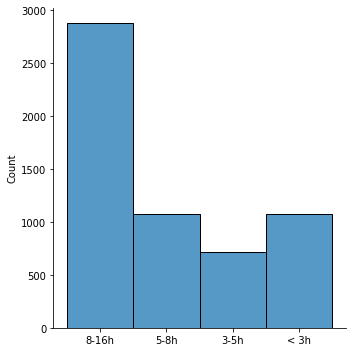

In [ ]:
sns.displot(y_dis)

In [ ]:
train_df['target_label'] = y_dis

In [ ]:
train_df.groupby('target_label')['row_id'].count()

target_label
3-5h      720
5-8h     1080
8-16h    2880
< 3h     1080
Name: row_id, dtype: int64

### **Split data for train and test**

In [ ]:
print(train_x.shape)

(5760, 243)


In [ ]:
# 242 columns = 40 lookback size * 6 process variables + 2 features --> flatten() in 1-dimension
X, X_test, y, y_test = train_test_split(train_x, train_y, test_size=0.2, random_state=123, stratify=train_y) 

print(X.shape)
print(X_test.shape)

(4608, 243)
(1152, 243)


In [ ]:
print(train_y.shape)

(5760, 4)


In [ ]:
train_x.shape

(5760, 243)

In [ ]:
type(train_x) == type(X) #numpy.ndarray

True

In [ ]:
y.shape

(4608, 4)

In [ ]:
test_df = pd.DataFrame(X_test, columns=columns)
test_df.head()

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id
0,14.06973,625.8102,47.7305,2.401447,46.99356,14.96017,14.09867,635.3009,48.35535,2.409317,...,15.58934,14.5761,626.0416,47.94456,2.409317,52.48456,15.48927,2.0,0,141003
1,13.89612,633.912,48.16119,2.404398,47.70086,20.83797,13.77315,625.8102,47.71843,2.410301,...,19.32806,13.92506,627.0834,49.28972,2.411285,45.37483,18.96784,2.0,0,140616
2,13.31742,630.787,46.72642,2.456539,37.61599,34.69265,13.28848,624.0741,47.02787,2.45162,...,32.18927,13.35359,624.4213,44.00551,2.453588,36.41919,32.18927,3.0,0,16722
3,13.34635,630.2083,44.45049,2.456539,45.53447,43.29718,13.41146,637.8472,43.51564,2.453588,...,33.57327,13.41146,638.4259,42.71762,2.455556,45.46792,33.26336,2.0,0,77540
4,13.65017,631.5625,43.83412,2.474248,46.81609,8.218108,13.614,621.6435,44.07137,2.468345,...,7.849543,13.65017,632.2916,43.39297,2.471296,44.89311,7.849543,6.0,1,68826


In [ ]:
test_df.tail()

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id
1147,13.4838,633.1019,43.60704,2.352257,37.96157,32.11888,13.70804,632.9861,43.72624,2.355208,...,32.10759,13.56337,634.375,44.66687,2.351273,41.31192,31.77018,1.0,0,24255
1148,13.5923,625.0,45.17606,2.475232,44.7231,7.835224,13.67911,635.8796,45.62232,2.466377,...,24.67488,13.614,623.8426,42.45908,2.479167,40.627,25.00781,6.0,1,69029
1149,13.83102,641.7824,49.18173,2.401447,46.66909,23.03709,13.79485,626.1574,49.54545,2.409317,...,21.4507,13.79485,632.7546,46.55751,2.405382,43.83448,21.34527,2.0,0,140365
1150,12.57957,555.2083,35.44965,1.861343,37.3428,31.58433,12.57957,555.2083,35.44965,1.861343,...,30.31108,12.57957,559.1436,35.60439,1.894792,40.45292,31.21186,6.0,1,127539
1151,14.12037,636.6898,50.48468,2.453588,51.17785,20.20549,14.0625,629.7454,50.11685,2.449653,...,19.43624,14.03356,637.1528,48.74578,2.460474,48.81079,19.41283,2.0,0,140733


In [ ]:
test_df[test_df.row_id.isin([17155, 24510, 69318, 77790, 128040, 141131])]

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id
40,11.34983,202.722794,1.946198,0.364005,2.322097,0.0,11.29196,203.37674,1.988258,0.364005,...,0.0,11.33536,201.368622,1.960537,0.364005,2.002474,0.0,1.0,1,128040
983,13.68634,632.8704,42.64836,2.466377,42.61063,21.5434,13.5923,618.9814,42.82111,2.475232,...,22.70494,13.5923,200.115738,43.62322,2.258796,43.99886,22.73604,1.0,1,69318


### **Feature scaling**

In [ ]:
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
#SCALING
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(X[:,:-1]) #last column is row_id
x_test_scaled = scaler.transform(X_test[:,:-1]) #last column is row_id

In [ ]:
joblib.dump(scaler, "scalers/standard_scaler") 
#scaler = joblib.load("scalers/standard_scaler") 

['scalers/standard_scaler']

In [ ]:
print(X.shape)
print(x_train_scaled.shape)
print(x_test_scaled.shape)

(4608, 243)
(4608, 242)
(1152, 242)


In [ ]:
y_test.shape

(1152, 4)

In [ ]:
x_train_scaled[0]

array([-1.08498287, -0.25429204, -0.38608995, -0.72710633,  0.00966758,
        0.5027924 , -0.9711374 , -0.25974113, -0.36497711, -0.72565708,
       -0.06935217,  0.57012045, -1.00612164, -0.24491281, -0.35349028,
       -0.72811495, -0.13275196,  0.56785085, -1.01733928, -0.30247877,
       -0.30361084, -0.72630901, -0.19077643,  0.63423989, -1.04351483,
       -0.34649373, -0.30534176, -0.71620487, -0.20742555,  0.69411468,
       -1.01315603, -0.27798516, -0.31649302, -0.71461017, -0.10858529,
        0.69876121, -1.10399409, -0.32105132, -0.30350687, -0.70883982,
       -0.04210616,  0.65628513, -0.9639143 , -0.3164909 , -0.28970361,
       -0.70530793, -0.15745534,  0.62933601, -1.06906511, -0.24140973,
       -0.27349681, -0.70432409, -0.21431579,  0.55763257, -0.91689835,
       -0.27519251, -0.18938369, -0.70510394, -0.08520634,  0.51072313,
       -1.11185228, -0.30482497, -0.16172871, -0.70820873, -0.08830969,
        0.51470605, -0.89822923, -0.298605  , -0.1506341 , -0.70

### **Create NN**

In [ ]:
import tensorflow.keras as keras
from keras import activations
import tensorflow as tf
from keras.layers import Dense
from keras.models import Sequential

In [ ]:
tf.keras.utils.set_random_seed(42)

In [ ]:
x_train_scaled.shape[1]

242

In [ ]:
print(y.shape)
print(x_train_scaled.shape)

(4608, 4)
(4608, 242)


In [ ]:
model = Sequential()
#model.add(Dense(x_train_scaled.shape[1], input_dim=x_train_scaled.shape[1], activation="tanh"))
model.add(Dense(32, input_dim=x_train_scaled.shape[1], activation="tanh"))
model.add(Dense(8, activation='relu'))
model.add(Dense(4, activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=['accuracy'])

history = model.fit(x_train_scaled, y, validation_split=0.2, epochs=100, batch_size=16)

Epoch 1/100
231/231 [==============================] - 2s 3ms/step - loss: 1.2648 - accuracy: 0.4737 - val_loss: 1.1584 - val_accuracy: 0.5824
Epoch 2/100
231/231 [==============================] - 1s 3ms/step - loss: 1.0438 - accuracy: 0.6183 - val_loss: 0.9636 - val_accuracy: 0.6193
Epoch 3/100
231/231 [==============================] - 1s 2ms/step - loss: 0.8928 - accuracy: 0.6465 - val_loss: 0.8453 - val_accuracy: 0.6714
Epoch 4/100
231/231 [==============================] - 1s 3ms/step - loss: 0.7928 - accuracy: 0.6961 - val_loss: 0.7734 - val_accuracy: 0.6974
Epoch 5/100
231/231 [==============================] - 1s 3ms/step - loss: 0.7305 - accuracy: 0.7105 - val_loss: 0.7052 - val_accuracy: 0.6996
Epoch 6/100
231/231 [==============================] - 1s 3ms/step - loss: 0.6680 - accuracy: 0.7276 - val_loss: 0.6659 - val_accuracy: 0.7202
Epoch 7/100
231/231 [==============================] - 1s 2ms/step - loss: 0.6257 - accuracy: 0.7396 - val_loss: 0.6160 - val_accuracy: 0.7430

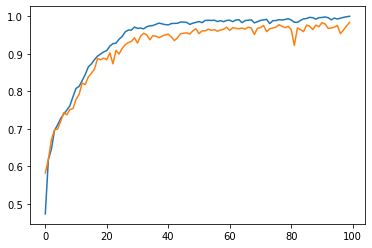

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.show()

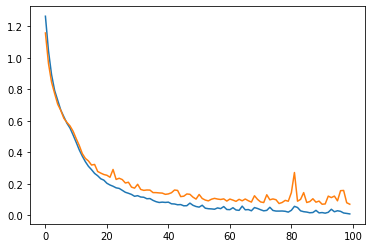

In [ ]:
#plot loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.show()

In [ ]:
model.save("models/tfk_ttf_label_NN")

In [ ]:
# It can be used to reconstruct the model identically.
#model = keras.models.load_model("models/tfk_ttf_label_NN")

### **Make predictions**

In [ ]:
print(x_test_scaled.shape)
print(y_test.shape)

(1152, 242)
(1152, 4)


In [ ]:
#x_train_scaled, train_y,
ttf_labels = ['< 3h', '3-5h', '5-8h', '8-16h']
y_pred = model.predict(x_test_scaled)
np.set_printoptions(suppress=True)

36/36 [==============================] - 0s 4ms/step


In [ ]:
x_test_scaled.shape

(1152, 242)

In [ ]:
y_pred.shape

(1152, 4)

In [ ]:
len(y_test)

1152

In [ ]:
index = 10
predicted = y_pred[index]
actual = y_test[index]

print("Predicted: ", ttf_labels[np.argmax(predicted)], " ", predicted)
print("Actual: ", ttf_labels[np.argmax(actual)], " ", actual)

Predicted:  3-5h   [0.00000719 0.9998002  0.         0.00019256]
Actual:  3-5h   [0. 1. 0. 0.]


### **Performance metrics**

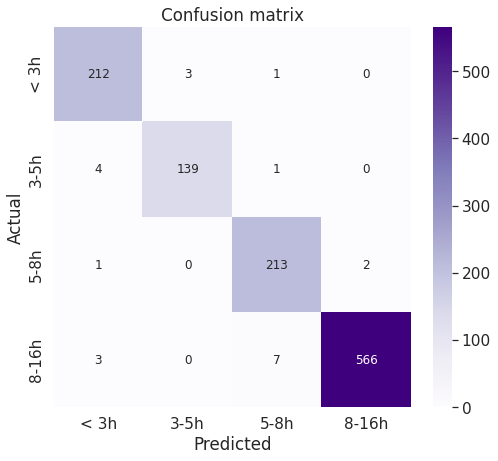

In [ ]:
from sklearn.metrics import confusion_matrix

y_true_label = []
y_pred_label = []

for i in range(len(y_test)):
    y_true_label.append(ttf_labels[np.argmax(y_test[i])])
    y_pred_label.append(ttf_labels[np.argmax(y_pred[i])])

cm = confusion_matrix(y_true_label, y_pred_label, labels=ttf_labels)

df_cm = pd.DataFrame(cm, ttf_labels, ttf_labels)
plt.figure(figsize=(8,7))
sns.set(font_scale=1.4) # for label size

hmap = sns.heatmap(df_cm, cmap="Purples", annot=True, fmt='g', annot_kws={"size": 12}) # font size

hmap.set_title('Confusion matrix')
hmap.set_xlabel("Predicted")
hmap.set_ylabel("Actual")

plt.show()

In [ ]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true_label, y_pred_label, labels=ttf_labels))


Classification Report

              precision    recall  f1-score   support

        < 3h       0.96      0.98      0.97       216
        3-5h       0.98      0.97      0.97       144
        5-8h       0.96      0.99      0.97       216
       8-16h       1.00      0.98      0.99       576

    accuracy                           0.98      1152
   macro avg       0.97      0.98      0.98      1152
weighted avg       0.98      0.98      0.98      1152



# **Example of model usage**

This is an example of model usage, starting from **selected sensors values** (6 out of 52 sensors).
<br>
<br>
Notice that the model requires **at least 40 minutes of history** before starting to produce predictions, this is reasonable since in the historical data BROKEN events are always at least 16 hours after exit from RECOVERING state.
<br>
<br>

Also, **TFF (Time From Failure encoding)** and **post extraordinary maintenance** flag can always be known for the current timestamp, thus data leakage occurs in the input features of the model.

In [ ]:
index = 10

In [ ]:
example_row_id = test_df.iloc[index,:]['row_id']
example_row_id

140888

In [ ]:
df_ts[df_ts.row_id==example_row_id]

,timestamp,sensor_06,sensor_04,sensor_11,sensor_00,sensor_10,sensor_12,operation,failure,row_id,post_extra_m,tff,tff_label,tff_encoding,ttf,ttf_label
5762,2018-07-07 20:08:00,14.12037,626.6204,46.87548,2.400463,48.72412,15.50887,1.0,0,140888,0,12848,5-10,2,243,3-5h


In [ ]:
train_df[train_df['row_id']==example_row_id]

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id,target_label
5516,14.26505,640.8564,44.0193,2.396528,41.47211,15.90991,14.06973,630.0926,44.42933,2.400463,...,14.12037,626.6204,46.87548,2.400463,48.72412,15.50887,2.0,0,140888,3-5h


In [ ]:
predicted = y_pred[index]
actual = y_test[index]

print("Predicted: ", ttf_labels[np.argmax(predicted)], " ", predicted)
print("Actual: ", ttf_labels[np.argmax(actual)], " ", actual)

Predicted:  3-5h   [0.00000719 0.9998002  0.         0.00019256]
Actual:  3-5h   [0. 1. 0. 0.]


# **Data preparation for TWX Analytics**

While preparing data for ThingWorx Analytics, it's important to remember that - in case they are necessary - these operations must be done in Python (**BEFORE importing data to TWX Analytics**):
- feature scaling
- random shuffling 

In [ ]:
twx_df = train_df.copy()

In [ ]:
twx_df.head()

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id,target_label
0,13.5923,637.8472,47.70694,2.45162,36.79974,35.34019,13.55613,634.375,46.86923,2.459491,...,13.59954,634.1436,46.43915,2.459491,37.88033,33.15711,3.0,0,16196,8-16h
1,13.55613,634.375,46.86923,2.459491,37.74342,34.63626,13.5272,645.4861,46.85873,2.449653,...,13.62847,632.5231,46.33397,2.448669,38.03409,33.15104,3.0,0,16197,8-16h
2,13.5272,645.4861,46.85873,2.449653,36.72395,34.92826,13.5923,634.0278,46.80311,2.459491,...,13.67911,641.088,45.94437,2.456539,38.3569,32.87244,3.0,0,16198,8-16h
3,13.5923,634.0278,46.80311,2.459491,36.4524,33.80935,13.65017,632.0602,46.23009,2.444734,...,13.55613,632.9861,45.69344,2.449653,38.56605,33.23922,3.0,0,16199,8-16h
4,13.65017,632.0602,46.23009,2.444734,35.98668,33.8417,13.64294,630.0926,45.48706,2.456539,...,13.55613,633.5648,45.84443,2.455556,36.94413,34.81812,3.0,0,16200,8-16h


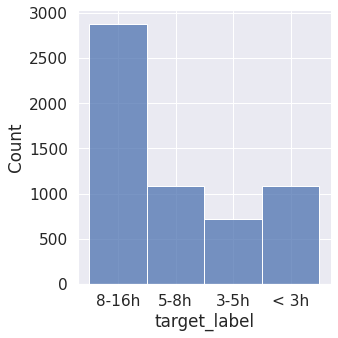

In [ ]:
sns.displot(twx_df['target_label'])

In [ ]:
scaler = joblib.load("scalers/standard_scaler") 

In [ ]:
twx_df[seq_twa_columns] = scaler.fit_transform(twx_df[seq_twa_columns])

In [ ]:
twx_df.head()

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id,target_label
0,0.259655,0.344218,0.515364,0.393655,-0.559976,0.918965,0.213178,0.316104,0.429699,0.410707,...,0.254350,0.336025,0.388694,0.420266,-0.387422,0.716709,3.0,0,16196,8-16h
1,0.213101,0.315791,0.429987,0.410667,-0.460215,0.850884,0.175967,0.406991,0.428630,0.389475,...,0.284776,0.323510,0.378614,0.398453,-0.372142,0.716135,3.0,0,16197,8-16h
2,0.175865,0.406758,0.428917,0.389404,-0.567988,0.879125,0.259702,0.313264,0.422971,0.410707,...,0.338034,0.389661,0.341278,0.414316,-0.340061,0.689803,3.0,0,16198,8-16h
3,0.259655,0.312949,0.423248,0.410667,-0.596695,0.770909,0.334138,0.297169,0.364666,0.378859,...,0.208696,0.327085,0.317231,0.400437,-0.319276,0.724469,3.0,0,16199,8-16h
4,0.334140,0.296840,0.364848,0.378772,-0.645928,0.774038,0.324838,0.281075,0.289063,0.404337,...,0.208696,0.331555,0.331701,0.412335,-0.480460,0.873701,3.0,0,16200,8-16h


In [ ]:
twx_df.shape

(5760, 244)

In [ ]:
twx_df_shuffled = twx_df.sample(frac=1, random_state=1).reset_index()

In [ ]:
twx_df_shuffled.head()

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,row_id,target_label
473,-0.010353,0.244724,0.429800,0.402162,0.090078,0.613516,-0.056652,0.325570,0.453698,0.397968,...,-0.110829,0.367313,0.768460,0.400437,-0.319888,0.907648,3.0,0,16669,8-16h
5519,0.911404,0.322424,0.165768,0.274583,-0.119513,-0.980764,0.957546,0.325571,0.137603,0.302423,...,0.779282,0.248420,0.493805,0.315173,0.579055,-0.927505,2.0,0,140891,3-5h
1807,0.185170,0.355589,0.556148,0.176772,0.069200,0.796904,0.222491,0.336932,0.619478,0.187771,...,0.185875,0.346752,0.001287,0.210078,0.154585,0.723225,2.0,0,24398,< 3h
4367,-0.987971,-0.233802,-0.483977,-0.733287,-0.208434,0.582061,-0.987102,-0.308745,-0.512043,-0.731575,...,-0.886810,-0.227148,-0.417278,-0.577131,-0.170769,0.700644,6.0,1,127608,5-8h
3451,-0.131392,0.269360,-0.493004,0.389404,0.152432,0.800541,-0.177611,0.290542,-0.460697,0.404337,...,-0.072789,0.285965,-0.032087,0.420266,0.538438,0.608119,2.0,0,77402,5-8h


In [ ]:
twx_df.loc[:, twx_df.columns != 'row_id'].head()

,sensor_06_39,sensor_04_39,sensor_11_39,sensor_00_39,sensor_10_39,sensor_12_39,sensor_06_38,sensor_04_38,sensor_11_38,sensor_00_38,...,sensor_12_1,sensor_06_0,sensor_04_0,sensor_11_0,sensor_00_0,sensor_10_0,sensor_12_0,tff_encoding,post_extra_m,target_label
0,0.259655,0.344218,0.515364,0.393655,-0.559976,0.918965,0.213178,0.316104,0.429699,0.410707,...,0.700342,0.254350,0.336025,0.388694,0.420266,-0.387422,0.716709,3.0,0,8-16h
1,0.213101,0.315791,0.429987,0.410667,-0.460215,0.850884,0.175967,0.406991,0.428630,0.389475,...,0.715806,0.284776,0.323510,0.378614,0.398453,-0.372142,0.716135,3.0,0,8-16h
2,0.175865,0.406758,0.428917,0.389404,-0.567988,0.879125,0.259702,0.313264,0.422971,0.410707,...,0.715232,0.338034,0.389661,0.341278,0.414316,-0.340061,0.689803,3.0,0,8-16h
3,0.259655,0.312949,0.423248,0.410667,-0.596695,0.770909,0.334138,0.297169,0.364666,0.378859,...,0.688877,0.208696,0.327085,0.317231,0.400437,-0.319276,0.724469,3.0,0,8-16h
4,0.334140,0.296840,0.364848,0.378772,-0.645928,0.774038,0.324838,0.281075,0.289063,0.404337,...,0.723573,0.208696,0.331555,0.331701,0.412335,-0.480460,0.873701,3.0,0,8-16h


In [ ]:
twx_df.loc[:, twx_df.columns != 'row_id'].shape

(5760, 243)

In [ ]:
twx_df.loc[:, twx_df.columns != 'row_id'].to_csv('sensor_ttf_label_seq_random_20220208.csv', index=False)

# **Key takeaways**

> Suggested approach is to **combine preventive maintenance and predictive maintenance**
  - If the last maintenance operation was not an extraordinary one (less than 5 days of NORMAL state duration), schedule a preventive maintenance check on the pump after 4 days from when the pump started working properly
  - On top of that, use model results for predictive maintenance.

- Discussion with **subject matter experts** can largely improve feature engineering phase, injectig some domain knowledge into the model.

- From a non-exhaustive set of **experiments with the NN architecture**, the model may have some problems generalizing with unseen data. Extensive experiment tracking and hyperparameter tuning is required before putting the model in production.

- For this model, efforts in improving feature will have more benefit than efforts in improving model (**data-centric approach** vs model-centric approach)

- Before putting the model in production, extensive testing must be conducted on **false positive behaviour**, since the model was trained on predicting failures that can happen within 16 hours. 

- Further tuning must be done on **probability threshold** for each alert category (e.g. alert of a short-term failure iff the estimated probability of that class is ABOVE a certain threshold).

